#Automated synapse detection platform
#Last updated November 2020
#Written by Daniel Dward, Department of Computational Medicine and Neurology, UCLA 
#Modified and Implemented by Austin Graves, Department of Neuroscience, Johns Hopkins School of Medicine

##### General assumptions and statements
1. Synapses are clusters of bright pixels grouped together, bounded by significantly dimmer areas of background noise.
2. In a 2d cross section (one z-slice), they are roughly circular, but can be ovoid. They are not square. (see Size Rule 3, below)
3. Synapses are distinguished from noise by having similar cross sectional profiles in roughly the same XY region across at least 3 adjacent Z sections
4. Synapses are distinguished from autofluorescence ("junk") by not spanning more than 6 adjacent Z-sections
5. "Autofluorescent junk" tends to me much brighter and larger than synapses [example: large blob centered at (525, 263,1)

Size rules:
1. In the Z-section where it appears brightest/largest (where I define each synapse), a synapse must contain at least 10 pixels in XY
2. A synapse cannot contain more than 150 pixels in XY
3. Synapses have an ovoidicity ratio (larger diameter / smaller diameter) ranging from 1.0 (perfect circle) to 3.0 (oval).

General statements about contrast:
1. The top sections tend to be brighter and have higher SNR, whereas deeper sections tend to be dimmer and have lower SNR
2. The range of acceptable contrast levels between synapses vs noise are thus dependent on both depth and total-field intensity of each local Z-section
3. I'm defining contrast as the ratio between the brightest pixel in the synapse (tends to be near the middle) and dim pixels immediately outside of my annotation (bordering the yellow circle, but not inside)
4. EDIT: I'm realizing that while this is a reasonable way to proceed, it's entirely dependent on a manually and arbitrarily set contrast range, and thus ratios of these arbitrary raw values may not be helpful. I think we should normalize the image 0-1 and then do this.

Contrast rules:
1. Towards the top of the volume, contrast ratios range from A-B
2. Towards the bottom of the volume, contrast ratios range from C-D

In [1]:
import numpy as np
%matplotlib notebook
import matplotlib.pyplot as plt

from PIL import Image
Image.MAX_IMAGE_PIXELS = 1e20

from skimage import io


from scipy.stats import norm


In [4]:
#Report time to complete synapse detection
import time
start = time.time()

In [5]:
# Define input file, must be .tif
# Define output directory
# if your prefix has a directory name, the directory will need to already exist
fname = '/Users/austingraves/Desktop/Huganir Lab/Data/SepA1 data/m4/m4_roi2_0hr.tif'
prefix = '/Users/austingraves/Desktop/Huganir Lab/Data/SepA1 data/Analyzed/m4/m4_roi2_0hr_'

In [7]:
# Setting detection parameters

# An example location to focus on for zoomed in visualizations
# this does not affect detections
row = 299
col = 587

# radius of rois to extract (i.e. a 2r+1 x 2r+1 region in 2D)
# this does not affect detections; only defines size of roi examples
r = 32 


# blurring for identifying local maxima and denoising
# the first two numbers here are very important for identifying target synpases
blurxy = 5 
local_max_zblur = 1 # for finding candidate synapses that are local max
zblur0 = 0 # for calculating snr in one slice
zblur1 = 2 # it should not decrease when averaging between neighbor slices
zblur2 = 4 # it should not increase when averaging between lots of slices


# remove candidate synapses that are too close to each other
# say 3 pixels away
# this is computed using a "farthest first traversal"
mindist = 3

# detection is based on template matching
# we build templates of nsizes different sizes
nsizes = 10
# we accept synapses in this range of sizes
sizemin = 10
sizemax = 150
# eccentricities
novals = 6 # this many different ovals
ovalmax = 3.0 # only accept with small eccentricity
# angles, oriented at this many angles
nthetas = 12



# remove synapses if their snr is too low relative 
# to measurements performed at random locations (defined on each slice)
n_location_samples = 300 # number of locations to sample on each slice
snr_percentile_cutoff = 0.9


# snr should not go down when averaging slices
# but due to the way it is calcluated non locally, we allow some "wiggle room"
snrZ1_factor = 1.5


# for masking out low intensity regions
rad_blur_mask = [10,100,100]
blur_mask_zscore = -1.0

# this highpass mask is not being used
rad_highpass_mask = [10,100,100] # not using
highpass_mask_zscore = -1.0


# for reproducibility
random_seed = 1

In [8]:
np.random.seed(random_seed)

In [9]:
#
I = io.imread(fname)
# if datasets have interleaved channels (e.g. red/green), 
# you will need to extract every other channel here
sshow = I.shape[0]//2 # show exmaple data on this slice

<IPython.core.display.Javascript object>


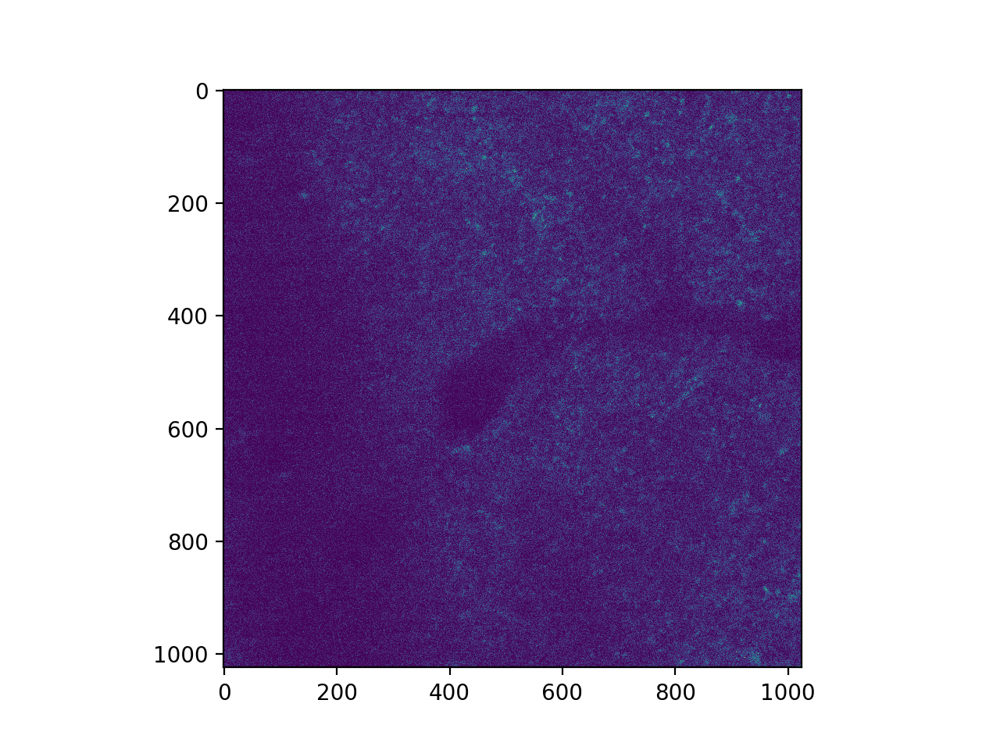

In [10]:
f,ax = plt.subplots()
ax.imshow(I[sshow])
f.canvas.draw()

<IPython.core.display.Javascript object>


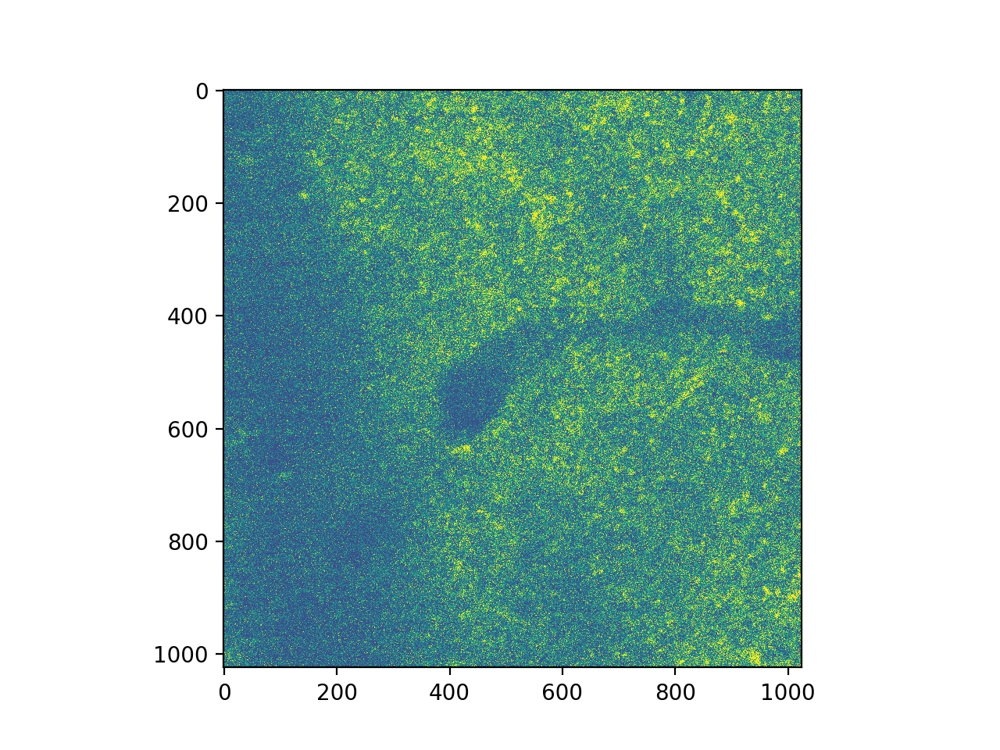

<IPython.core.display.Javascript object>


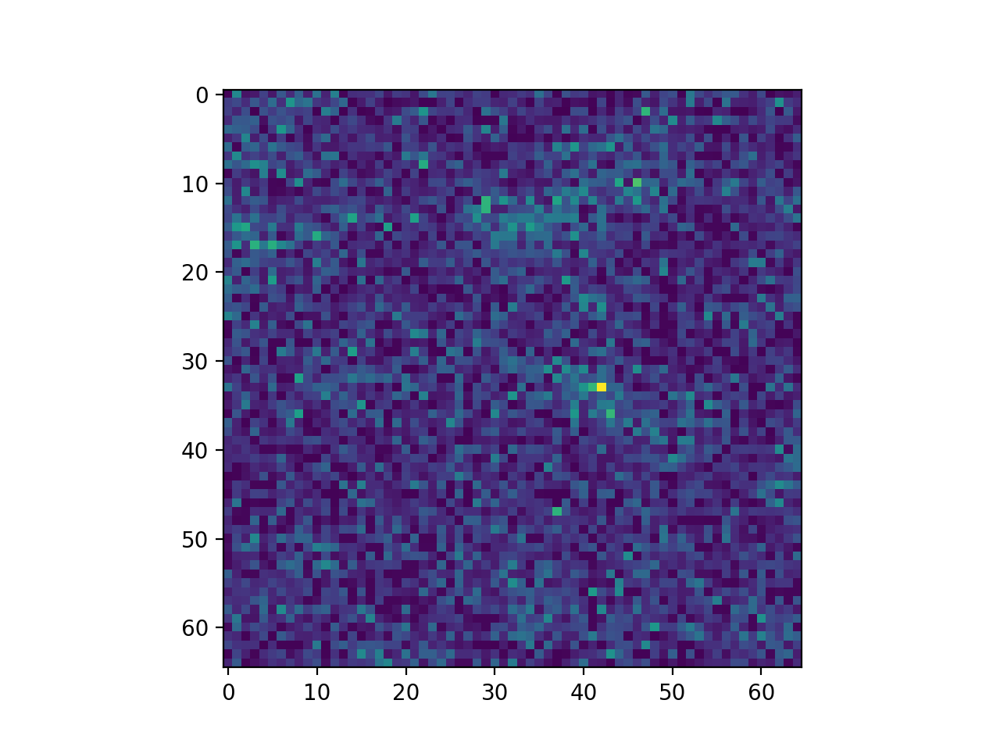

In [11]:
# radius of roi to extract
s = sshow

roi = np.copy(I[s])
f,ax = plt.subplots()

roi = roi.astype(float)
roi -= np.mean(roi)
roi /= np.std(roi)
ax.imshow(roi,vmin=-2,vmax=2)

roi = I[s,row-r:row+r+1,col-r:col+r+1]
f,ax = plt.subplots()
ax.imshow(roi)


In [12]:
# first thing to do is blur,
# we will only consider you a candidate if you are a local max after bluring
def make_kernel(r):
    r = np.asarray(r)
    if r.ndim == 0:
        r = np.array([r,r,r])
    r = r.astype(int)
    # next make a kernel
    x = [np.arange(-ri,ri+1) for ri in r]    
    X = np.stack(np.meshgrid(*x,indexing='ij'),axis=-1)    
    K = np.exp(-np.sum(X**2/2.0/((r+1e-6)/3.0)**2,-1))
    K /= np.sum(K)
    
    return K
    
def blur(I,r=None,K=None):
    '''
    r should be either a single or a tuple
    
    requires either r or K
    
    '''
    
    if (r is None and K is None) or (r is not None and K is not None):
        raise Exception('Must specify either r or K')
        
    if r is not None and K is None:
        r = np.asarray(r)
        K = make_kernel(r)
    else:        
        r = (np.array(K.shape) - 1)/2.0
        r = r.astype(int)
    
        
    
    # first thing pad I
    Ip = np.pad(I,((r[0],r[0]),(r[1],r[1]),(r[2],r[2])),mode='reflect') # note symmetric doubles the last entry, reflect does not
    
    
    
    
    # now we pad K, only on the right
    topad = np.array(Ip.shape) - K.shape
    Kp = np.pad(K,[(0,t) for t in topad])
    # circshift
    Kp = np.roll(Kp,shift=-r,axis=(0,1,2))
    
    # now we fourier transform
    Iphat = np.fft.fftn(Ip)
    Kphat = np.fft.fftn(Kp)
    
    # now we filter
    Ibp = np.fft.ifftn(Iphat*Kphat).real
    
    # now crop
    # note this cropping syntax only works for r > 0
    Ib = np.copy(Ibp)
    if r[0] > 0:
        Ib = Ib[r[0]:-r[0]]
    if r[1] > 0:
        Ib = Ib[:,r[1]:-r[1]]
    if r[2] > 0:
        Ib = Ib[:,:,r[2]:-r[2]]
    
    
    return Ib


<IPython.core.display.Javascript object>


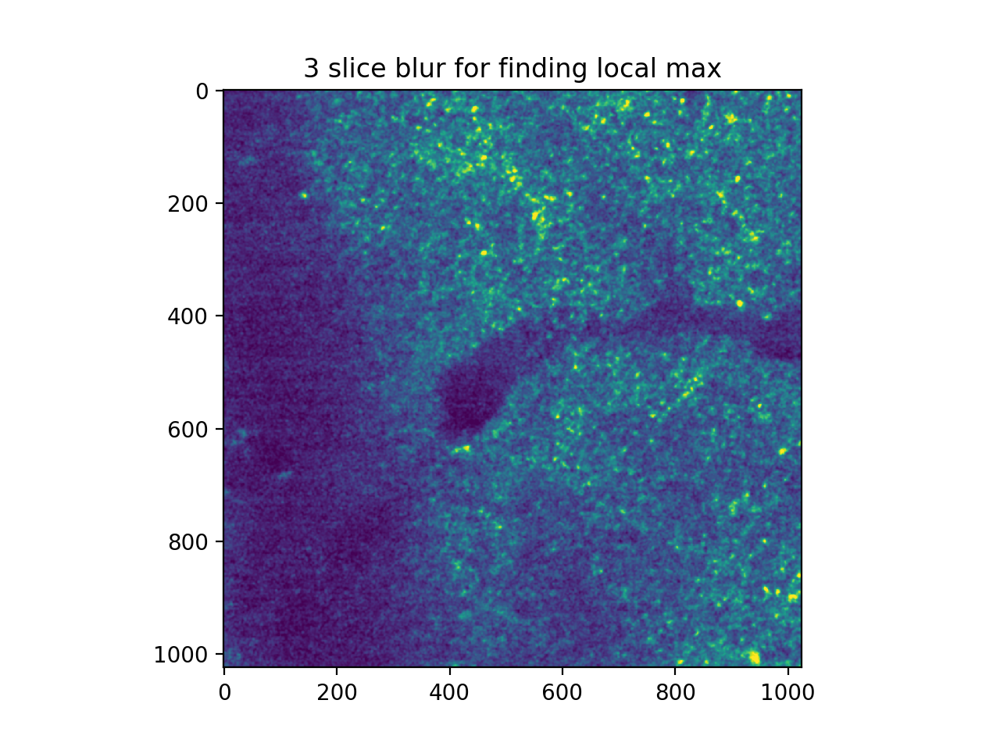

<IPython.core.display.Javascript object>


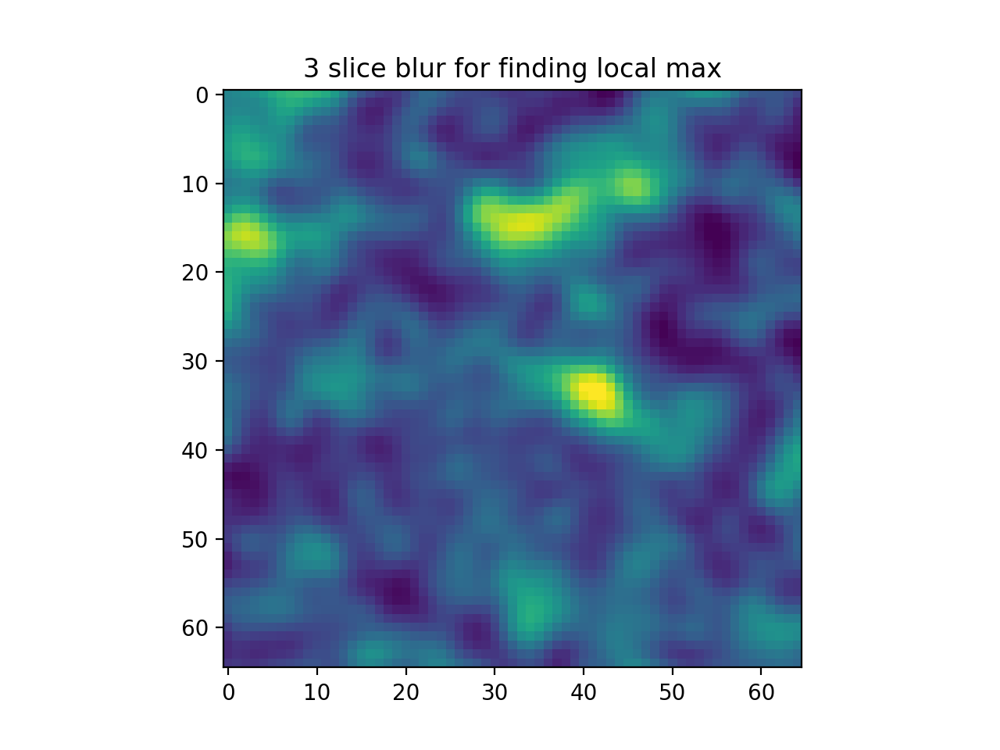

<IPython.core.display.Javascript object>


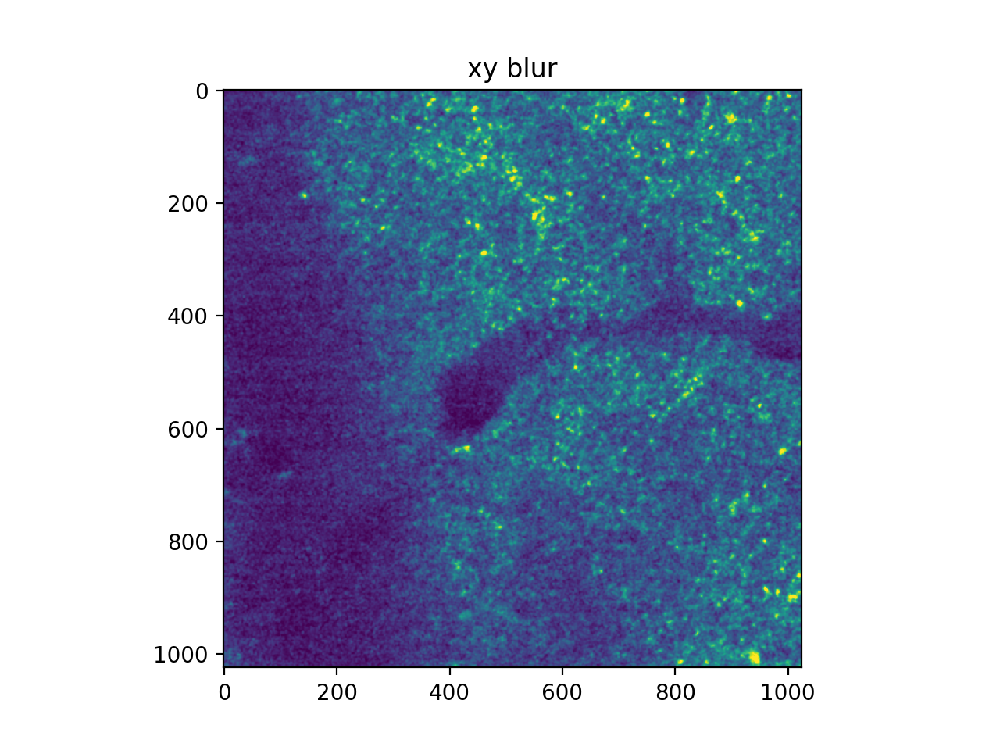

<IPython.core.display.Javascript object>


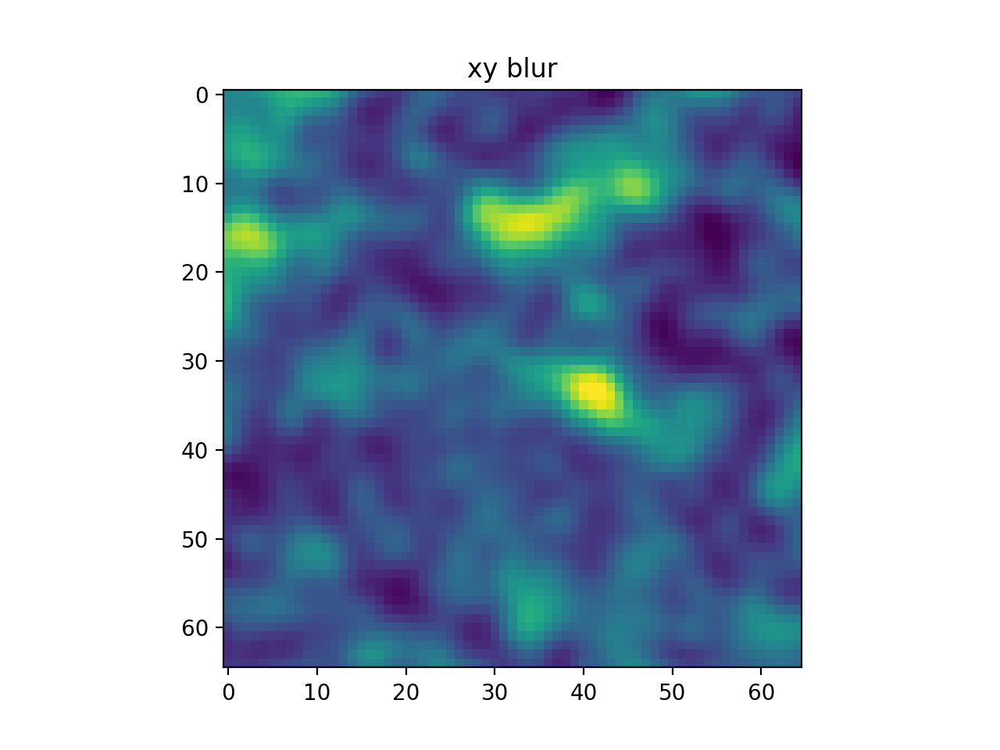

<IPython.core.display.Javascript object>


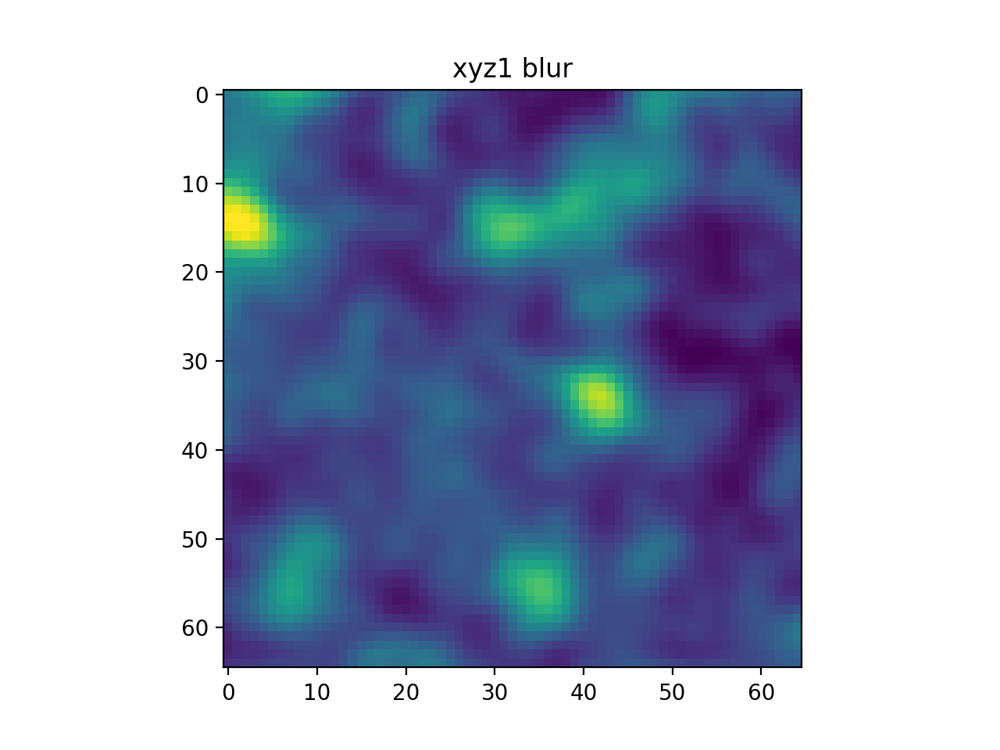

<IPython.core.display.Javascript object>


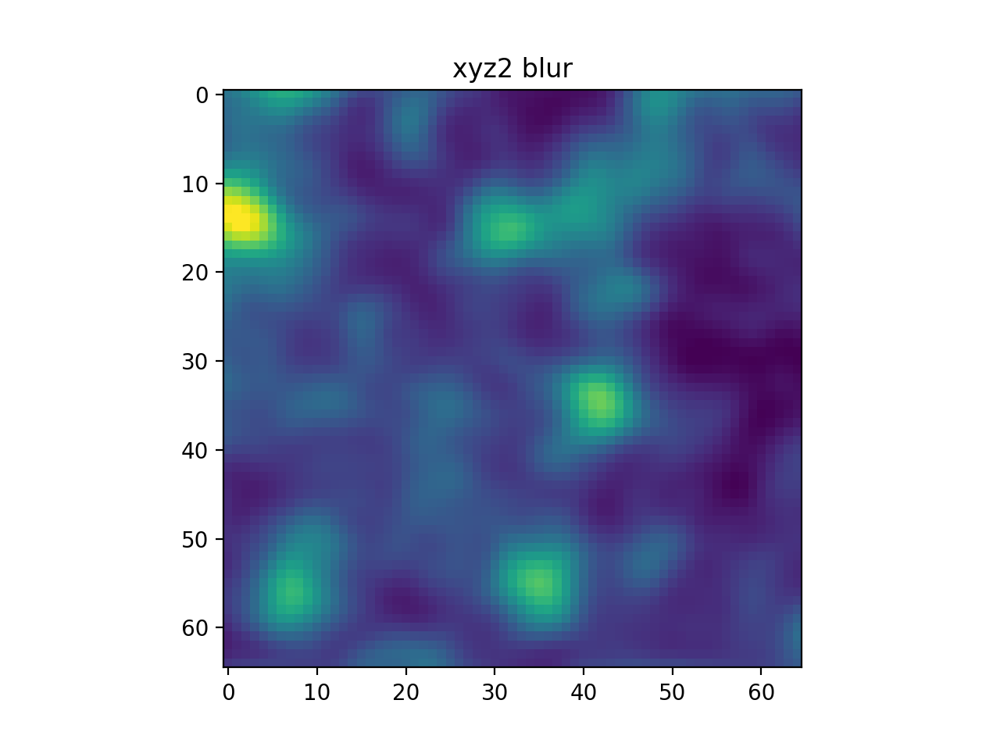

In [13]:
# finding local max candidates
radb = [local_max_zblur,blurxy,blurxy] 

# for looking at signal on a slice
radxy = [zblur0,blurxy,blurxy] 
radxyz1 = [zblur1,blurxy,blurxy]
radxyz2 = [zblur2,blurxy,blurxy]

Ib = blur(I,radb)

f,ax = plt.subplots()
toshow = Ib[s]
ax.imshow(toshow,vmin=np.quantile(toshow,0.001),vmax=np.quantile(toshow,0.999))
ax.set_title('3 slice blur for finding local max')
f.canvas.draw()
f,ax = plt.subplots()
toshow = Ib[s,row-r:row+r+1,col-r:col+r+1]
ax.imshow(toshow,vmin=np.quantile(toshow,0.001),vmax=np.quantile(toshow,0.999))
ax.set_title('3 slice blur for finding local max')
f.canvas.draw()



Ibxy = blur(I,radxy)

f,ax = plt.subplots()
toshow = Ibxy[s]
ax.imshow(toshow,vmin=np.quantile(toshow,0.001),vmax=np.quantile(toshow,0.999))
ax.set_title('xy blur')
f.canvas.draw()
f,ax = plt.subplots()
toshow = Ibxy[s,row-r:row+r+1,col-r:col+r+1]
ax.imshow(toshow,vmin=np.quantile(toshow,0.001),vmax=np.quantile(toshow,0.999))
ax.set_title('xy blur')
f.canvas.draw()


Ibxyz1 = blur(I,radxyz1)
f,ax = plt.subplots()
toshow = Ibxyz1[s,row-r:row+r+1,col-r:col+r+1]
ax.imshow(toshow,vmin=np.quantile(toshow,0.001),vmax=np.quantile(toshow,0.999))
ax.set_title('xyz1 blur')
f.canvas.draw()


Ibxyz2 = blur(I,radxyz2)
f,ax = plt.subplots()
toshow = Ibxyz2[s,row-r:row+r+1,col-r:col+r+1]
ax.imshow(toshow,vmin=np.quantile(toshow,0.001),vmax=np.quantile(toshow,0.999))
ax.set_title('xyz2 blur')
f.canvas.draw()


<IPython.core.display.Javascript object>


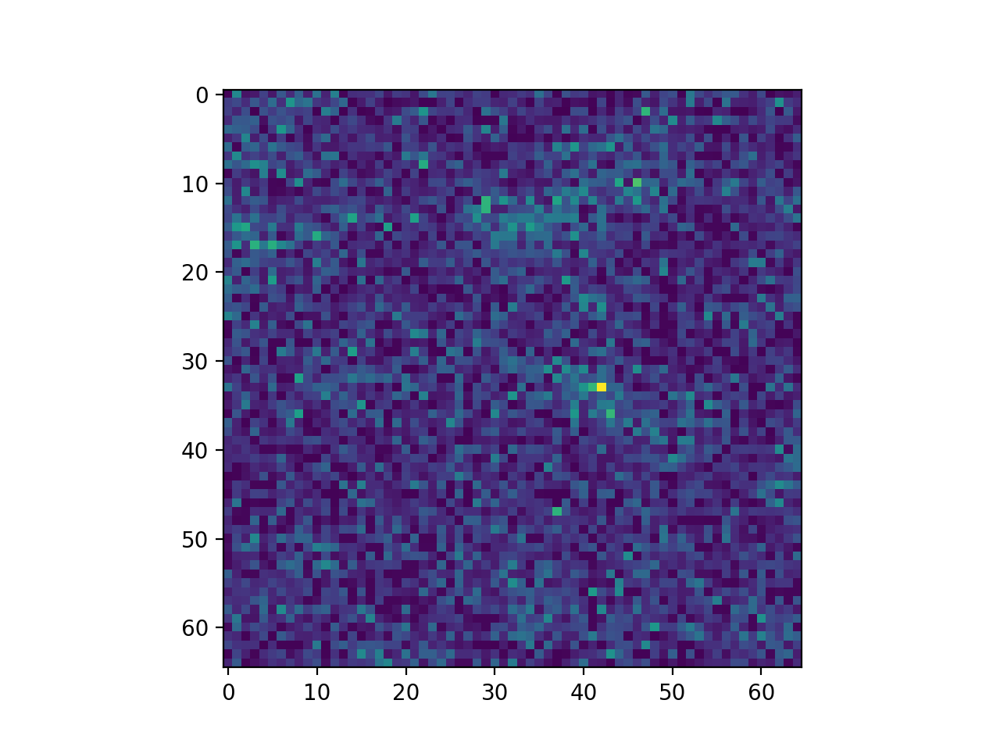

<IPython.core.display.Javascript object>


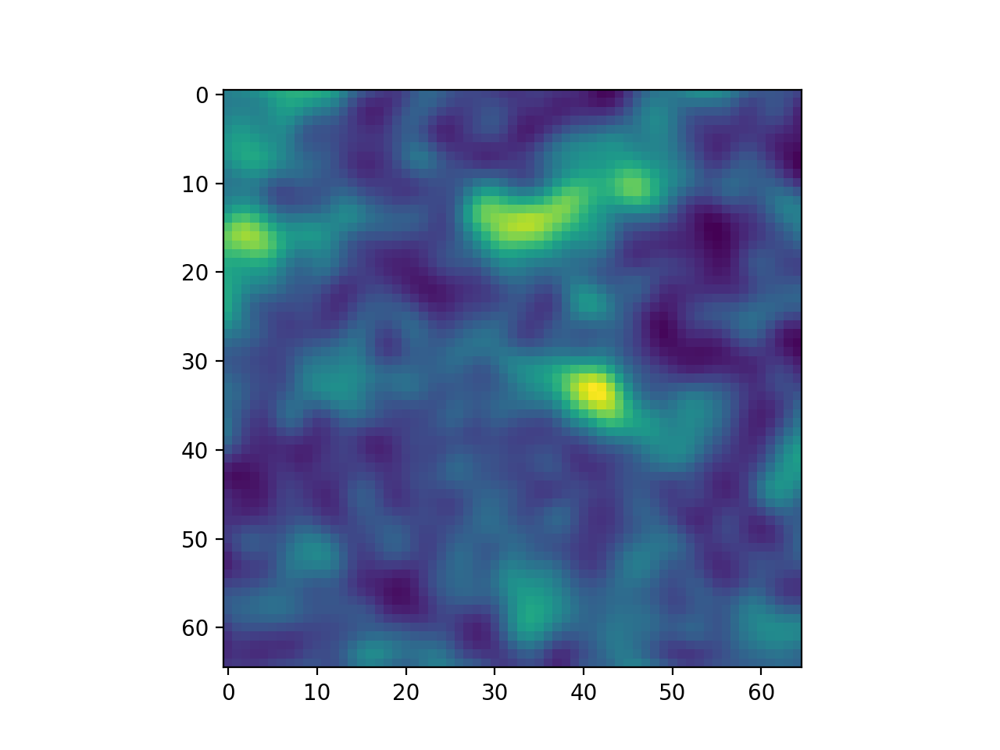

In [14]:
roi = I[s,row-r:row+r+1,col-r:col+r+1]
f,ax = plt.subplots()
ax.imshow(roi)
f.canvas.draw()

roi = Ib[s,row-r:row+r+1,col-r:col+r+1]
f,ax = plt.subplots()
ax.imshow(roi)
f.canvas.draw()

In [17]:
# find all the local maxima
M = np.ones_like(Ib)
for rr in np.arange(-1,1+1):
    for cc in np.arange(-1,1+1):
        for ss in np.arange(-1,1+1):
            if rr==0 and cc==0 and ss==0:
                continue
            M = np.logical_and(M, Ib > np.roll(Ib,(rr,cc,ss),(0,1,2)))
            
print('Number of locations to consider')
print(np.sum(M)) 
            

Number of locations to consider
646459


<IPython.core.display.Javascript object>


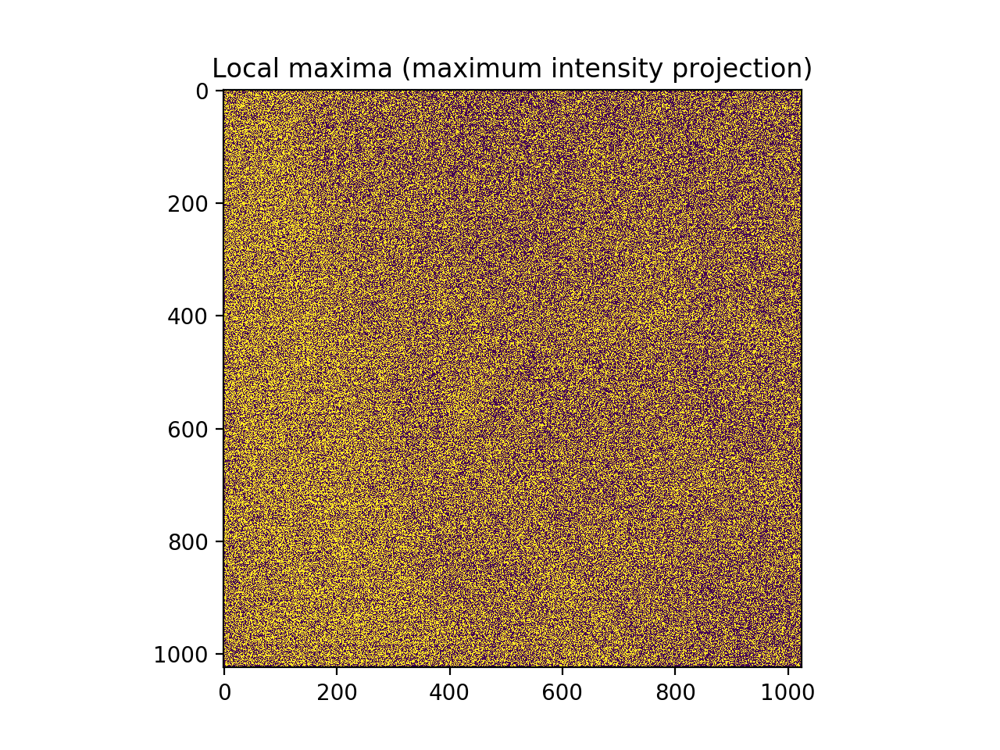

<IPython.core.display.Javascript object>


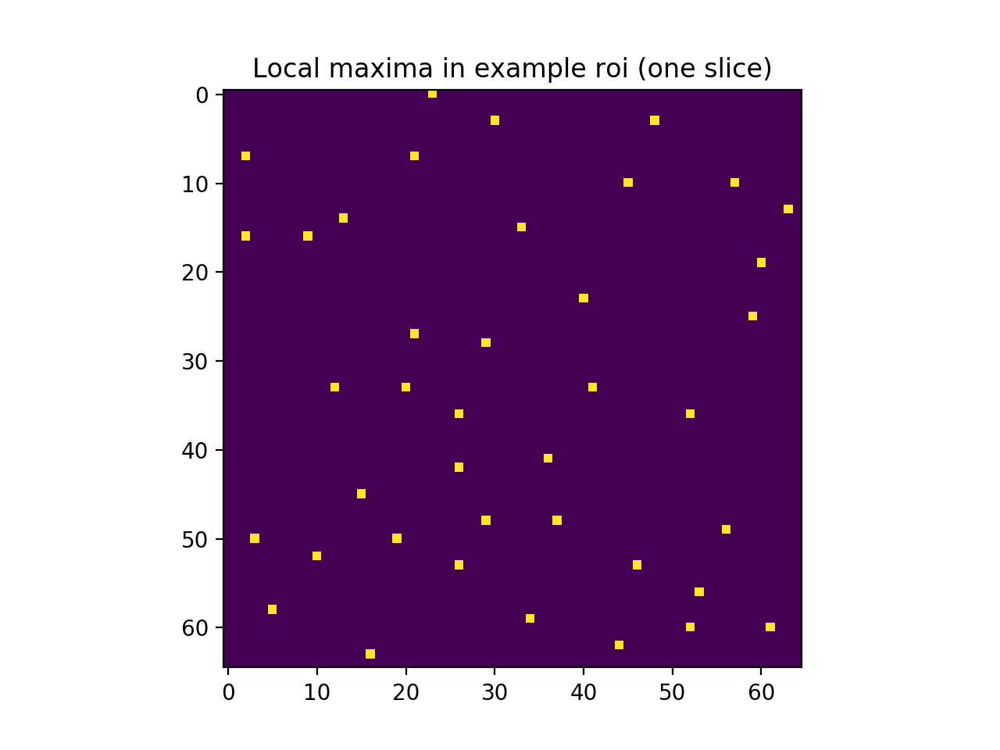

In [18]:
f,ax = plt.subplots()
ax.imshow(np.max(M,0))
ax.set_title('Local maxima (maximum intensity projection)')
f.canvas.draw()

roi = M[s,row-r:row+r+1,col-r:col+r+1]
f,ax = plt.subplots()
ax.imshow(roi)
ax.set_title('Local maxima in example roi (one slice)')
f.canvas.draw()

<IPython.core.display.Javascript object>


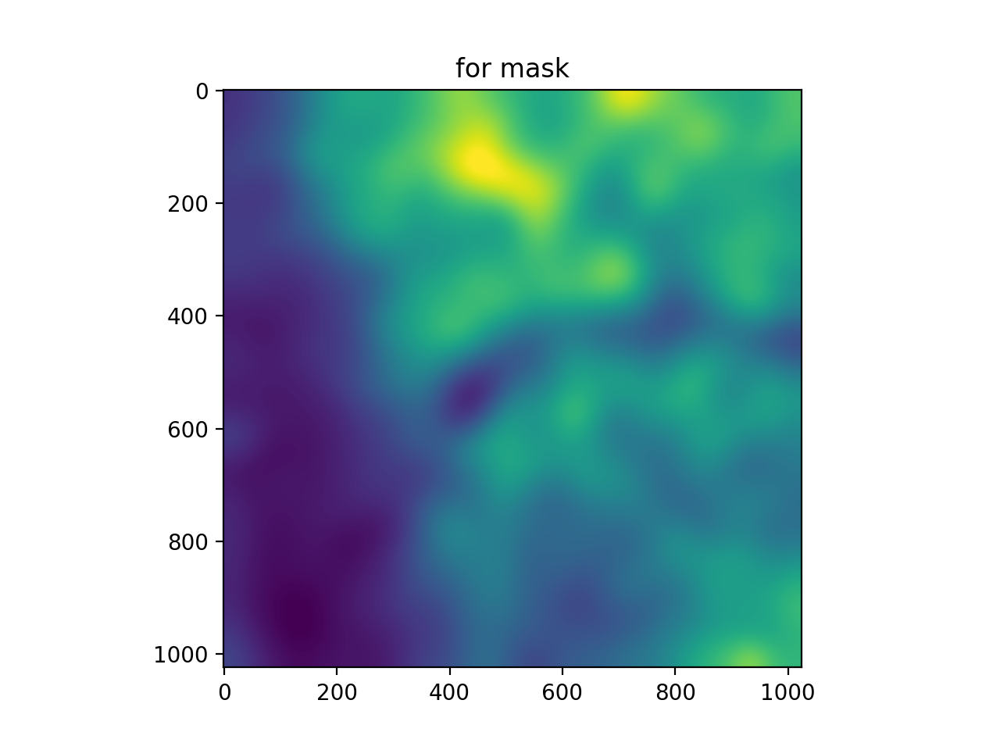

<IPython.core.display.Javascript object>


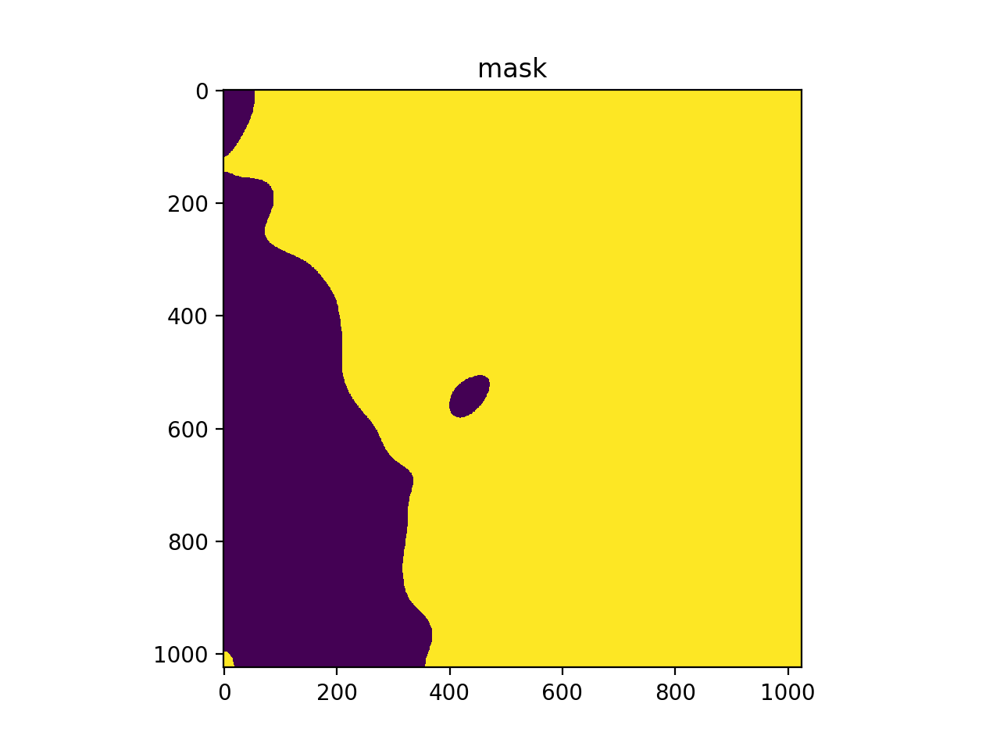

after masking 488842 locations


In [21]:
# build a mask
# cut out large dark regions

Izscore = (I - np.mean(I))/np.std(I)

Iblur_for_mask = blur(Izscore,rad_blur_mask)
Iblur_for_mask -= np.mean(Iblur_for_mask)
Iblur_for_mask /= np.std(Iblur_for_mask)



f,ax = plt.subplots()
toshow = Iblur_for_mask[s]
ax.imshow(toshow,vmin=np.quantile(toshow,0.001),vmax=np.quantile(toshow,0.999))
ax.set_title('for mask')
f.canvas.draw()

mask = (Iblur_for_mask > blur_mask_zscore) 
f,ax = plt.subplots()
ax.imshow(mask[s])
ax.set_title('mask')
f.canvas.draw()

locs = np.nonzero(M*mask)
print(f'after masking {len(locs[0])} locations')

In [23]:
# furthest first traversal to remove local max that are too close
L = np.array(list(zip(*locs)))
# not selected points

# initialize set of points and distances
# list of selected points
points = []
# distance of each point to selected point
distances = np.ones(L.shape[0])*np.infty

count = 0
mindist2 = mindist**2
while L.shape[0] > 0:
    # scan not selected points and find biggest distance
    ind = np.argmax(distances)
    dmax = distances[ind]
    if distances[ind] < mindist2:
        break
    # add it to selected
    points.append(np.copy(L[ind])) # adding a copy here seemed to fix the memory leak
    
    # remove it from not selected
    L = np.delete(L,ind,axis=0)    
    distances = np.delete(distances,ind)
    
    # For each remaining not-yet-selected point q, 
    # replace the distance stored for q by the minimum of its old value and the distance from p to q.
    d2 = np.sum(((points[-1] - L))**2,-1)    
    distances = np.minimum(d2,distances)
    
    if not count%1000:
        print(f'Found {len(points)} out of {len(locs[0])} points separated by more than {np.sqrt(dmax)}')
        
    count += 1
print(f'Found {len(points)} out of {len(locs[0])} points separated by more than {mindist}')
points = np.array(points)
locs = (points[:,0],points[:,1],points[:,2])

Found 1 out of 488842 points separated by more than inf
Found 1001 out of 488842 points separated by more than 43.31281565541543
Found 2001 out of 488842 points separated by more than 33.0
Found 3001 out of 488842 points separated by more than 28.231188426986208
Found 4001 out of 488842 points separated by more than 25.15949125081825
Found 5001 out of 488842 points separated by more than 23.08679276123039
Found 6001 out of 488842 points separated by more than 21.540659228538015
Found 7001 out of 488842 points separated by more than 20.248456731316587
Found 8001 out of 488842 points separated by more than 19.28730152198591
Found 9001 out of 488842 points separated by more than 18.466185312619388
Found 10001 out of 488842 points separated by more than 17.69180601295413
Found 11001 out of 488842 points separated by more than 17.08800749063506
Found 12001 out of 488842 points separated by more than 16.431676725154983
Found 13001 out of 488842 points separated by more than 16.0312195418814


Found 113001 out of 488842 points separated by more than 6.708203932499369
Found 114001 out of 488842 points separated by more than 6.708203932499369
Found 115001 out of 488842 points separated by more than 6.708203932499369
Found 116001 out of 488842 points separated by more than 6.708203932499369
Found 117001 out of 488842 points separated by more than 6.6332495807108
Found 118001 out of 488842 points separated by more than 6.6332495807108
Found 119001 out of 488842 points separated by more than 6.6332495807108
Found 120001 out of 488842 points separated by more than 6.48074069840786
Found 121001 out of 488842 points separated by more than 6.48074069840786
Found 122001 out of 488842 points separated by more than 6.4031242374328485
Found 123001 out of 488842 points separated by more than 6.4031242374328485
Found 124001 out of 488842 points separated by more than 6.4031242374328485
Found 125001 out of 488842 points separated by more than 6.4031242374328485
Found 126001 out of 488842 po

Found 226001 out of 488842 points separated by more than 4.69041575982343
Found 227001 out of 488842 points separated by more than 4.69041575982343
Found 228001 out of 488842 points separated by more than 4.69041575982343
Found 229001 out of 488842 points separated by more than 4.69041575982343
Found 230001 out of 488842 points separated by more than 4.58257569495584
Found 231001 out of 488842 points separated by more than 4.58257569495584
Found 232001 out of 488842 points separated by more than 4.58257569495584
Found 233001 out of 488842 points separated by more than 4.58257569495584
Found 234001 out of 488842 points separated by more than 4.58257569495584
Found 235001 out of 488842 points separated by more than 4.58257569495584
Found 236001 out of 488842 points separated by more than 4.58257569495584
Found 237001 out of 488842 points separated by more than 4.58257569495584
Found 238001 out of 488842 points separated by more than 4.58257569495584
Found 239001 out of 488842 points sepa

Found 337001 out of 488842 points separated by more than 3.605551275463989
Found 338001 out of 488842 points separated by more than 3.605551275463989
Found 339001 out of 488842 points separated by more than 3.605551275463989
Found 340001 out of 488842 points separated by more than 3.605551275463989
Found 341001 out of 488842 points separated by more than 3.605551275463989
Found 342001 out of 488842 points separated by more than 3.605551275463989
Found 343001 out of 488842 points separated by more than 3.605551275463989
Found 344001 out of 488842 points separated by more than 3.605551275463989
Found 345001 out of 488842 points separated by more than 3.605551275463989
Found 346001 out of 488842 points separated by more than 3.605551275463989
Found 347001 out of 488842 points separated by more than 3.605551275463989
Found 348001 out of 488842 points separated by more than 3.605551275463989
Found 349001 out of 488842 points separated by more than 3.605551275463989
Found 350001 out of 48884

In [25]:
# dilation is used for templates
def dilate2d(I,N):
    x = np.arange(-N,N+1)
    X = np.meshgrid(x,x)
    T = X[0]**2 + X[1]**2 <= N**2    
    T = T.astype(float)
    
    
    return (blur(I[None],K=T[None]) > 1e-2)[0]

<IPython.core.display.Javascript object>


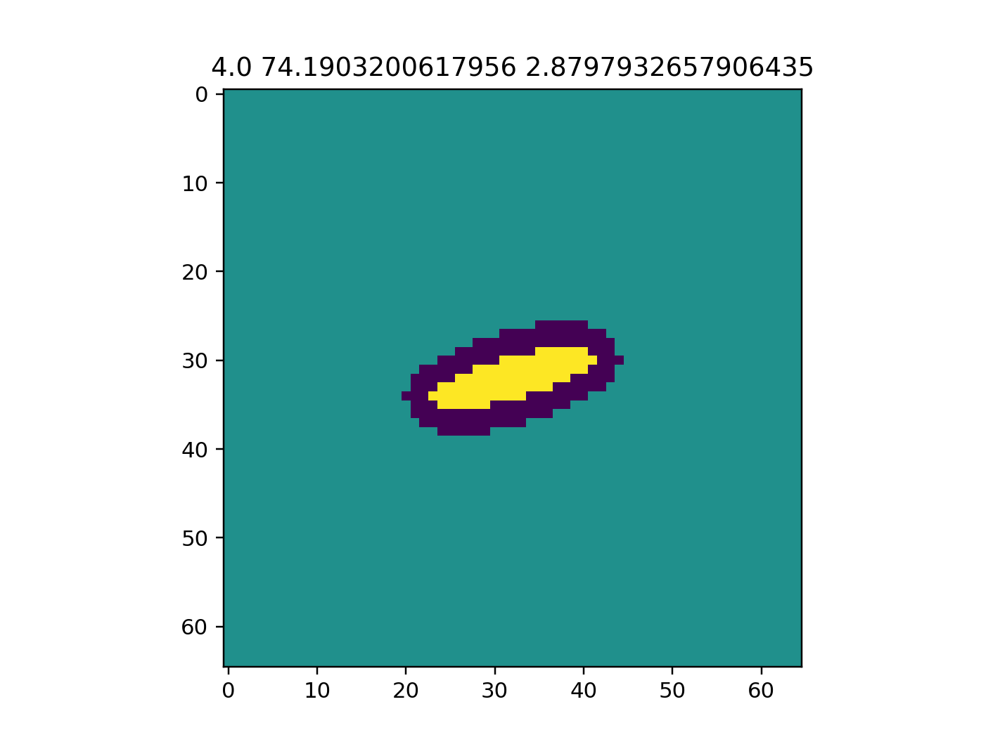

area 0.22258652247693084
area 1.809679938204399
area 10.000000000000002
area 24.793546707863737
area 46.19032006179561
area 74.19032006179559
area 108.79354670786373
area 150.00000000000003
area 197.8096799382044
area 252.22258652247697
area 0.2225865224769309
area 1.809679938204399
area 10.000000000000004
area 24.793546707863737
area 46.19032006179561
area 74.1903200617956
area 108.79354670786371
area 149.99999999999997
area 197.8096799382044
area 252.222586522477
area 0.22258652247693086
area 1.8096799382043989
area 10.000000000000005
area 24.79354670786373
area 46.19032006179561
area 74.19032006179559
area 108.79354670786373
area 149.99999999999997
area 197.80967993820437
area 252.22258652247697
area 0.2225865224769309
area 1.8096799382043987
area 10.000000000000004
area 24.79354670786374
area 46.19032006179561
area 74.1903200617956
area 108.79354670786373
area 150.0
area 197.80967993820437
area 252.222586522477
area 0.22258652247693084
area 1.809679938204399
area 10.000000000000002

In [26]:
# define a set of inside and an outside templates
# we will have sizes
# angles
# eccentricitys
# this will be a 2D template

# note r is the radius of the template!
templates = []
squares = []
names = []
x = np.arange(-r,r+1)
X = np.stack(np.meshgrid(x,x))

# angles
thetas = np.arange(nthetas) * np.pi/nthetas

#
sizes = np.linspace(np.sqrt(sizemin),np.sqrt(sizemax),nsizes-4)
d = sizes[1]-sizes[0]

# add extra, out of bounds sizes
sizes = np.concatenate( ( [sizes[0]-d*2,sizes[0]-d],sizes,[sizes[-1]+d,sizes[-1]+d*2] )) 
sizes = sizes**2

# ovoicity
ovals = np.linspace(1,ovalmax+1,novals) 




f,ax = plt.subplots()
# now we can build up templates
for o in ovals:
    for si in sizes:
        # get the major and minor axes
        # we want
        # area = s = pi a b
        # a = o b
        # so
        # s = pi o b**2
        # so 
        # b = sqrt(s / pi / o)
        b = np.sqrt(si / np.pi / o)
        a = o * b
        print(f'area {np.pi*a*b}')
        
        # we don't want really big and long ones
        if a > np.max( np.sqrt(sizes / np.pi) )*1.1:
            continue
        
        # for rectangles
        # area = s = 4ab
        # a = ob
        # area = 4 o b**2
        # b = sqrt(area / 4 / o)
        bs = np.sqrt(si/4/o)
        as_ = o*bs
        for t in thetas:
            
            Y = np.stack( (X[0]*np.cos(t) + X[1]*np.sin(t), -X[0]*np.sin(t) + X[1]*np.cos(t)))
            
            # this is the inside region
            Tin = (Y[0]/a)**2 + (Y[1]/b)**2 <= 1**2            

            
            # this is the outside region            
            ndilate = 3
            Tout = np.logical_xor(dilate2d(Tin,ndilate),Tin)
            
            T = Tin.astype(int)-Tout.astype(int)
            
            if np.sum(T==1) <= 3:
                continue
            
            # add the template
            templates.append(T)
            names.append((o,np.sum(T==1),t))
            

            #'''
            ax.cla()
            ax.imshow(T)
            ax.set_title(f'{o} {si} {t}')
            f.canvas.draw()
            #'''
            
            if o == 1: # only one theta for circles, commented this out when doing squares
                break
templates = np.stack(templates)
                

In [27]:
np.sum(templates==1,axis=(1,2))

array([  9,  21,  45,  69, 109, 145, 193, 249,  11,  13,   9,   7,   9,
        13,  11,  13,   9,   7,   9,  13,  27,  25,  27,  19,  27,  25,
        27,  25,  27,  19,  27,  25,  43,  45,  47,  43,  47,  45,  43,
        45,  47,  43,  47,  45,  75,  75,  75,  73,  75,  75,  75,  75,
        75,  73,  75,  75, 107, 109, 109, 109, 109, 109, 107, 109, 109,
       109, 109, 109, 149, 149, 151, 151, 151, 149, 149, 149, 151, 151,
       151, 149,  11,  11,   9,  11,   9,  11,  11,  11,   9,  11,   9,
        11,  23,  25,  21,  25,  21,  25,  23,  25,  21,  25,  21,  25,
        49,  43,  45,  47,  45,  43,  49,  43,  45,  47,  45,  43,  73,
        75,  71,  75,  71,  75,  73,  75,  71,  75,  71,  75, 105, 111,
       111, 109, 111, 111, 105, 111, 111, 109, 111, 111,   7,  13,   9,
        13,   9,  13,   7,  13,   9,  13,   9,  13,  25,  19,  23,  25,
        23,  19,  25,  19,  23,  25,  23,  19,  49,  45,  43,  43,  43,
        45,  49,  45,  43,  43,  43,  45,  73,  77,  69,  75,  6

In [28]:
sizes

array([2.22586522e-01, 1.80967994e+00, 1.00000000e+01, 2.47935467e+01,
       4.61903201e+01, 7.41903201e+01, 1.08793547e+02, 1.50000000e+02,
       1.97809680e+02, 2.52222587e+02])

In [29]:
ovals

array([1.  , 1.75, 2.5 , 3.25, 4.  ])

In [30]:
thetas*180/np.pi

array([  0.,  15.,  30.,  45.,  60.,  75.,  90., 105., 120., 135., 150.,
       165.])

In [31]:
names

[(1.0, 9, 0.0),
 (1.0, 21, 0.0),
 (1.0, 45, 0.0),
 (1.0, 69, 0.0),
 (1.0, 109, 0.0),
 (1.0, 145, 0.0),
 (1.0, 193, 0.0),
 (1.0, 249, 0.0),
 (1.75, 11, 0.0),
 (1.75, 13, 0.2617993877991494),
 (1.75, 9, 0.5235987755982988),
 (1.75, 7, 0.7853981633974483),
 (1.75, 9, 1.0471975511965976),
 (1.75, 13, 1.3089969389957472),
 (1.75, 11, 1.5707963267948966),
 (1.75, 13, 1.832595714594046),
 (1.75, 9, 2.0943951023931953),
 (1.75, 7, 2.356194490192345),
 (1.75, 9, 2.6179938779914944),
 (1.75, 13, 2.8797932657906435),
 (1.75, 27, 0.0),
 (1.75, 25, 0.2617993877991494),
 (1.75, 27, 0.5235987755982988),
 (1.75, 19, 0.7853981633974483),
 (1.75, 27, 1.0471975511965976),
 (1.75, 25, 1.3089969389957472),
 (1.75, 27, 1.5707963267948966),
 (1.75, 25, 1.832595714594046),
 (1.75, 27, 2.0943951023931953),
 (1.75, 19, 2.356194490192345),
 (1.75, 27, 2.6179938779914944),
 (1.75, 25, 2.8797932657906435),
 (1.75, 43, 0.0),
 (1.75, 45, 0.2617993877991494),
 (1.75, 47, 0.5235987755982988),
 (1.75, 43, 0.78539816339

<IPython.core.display.Javascript object>


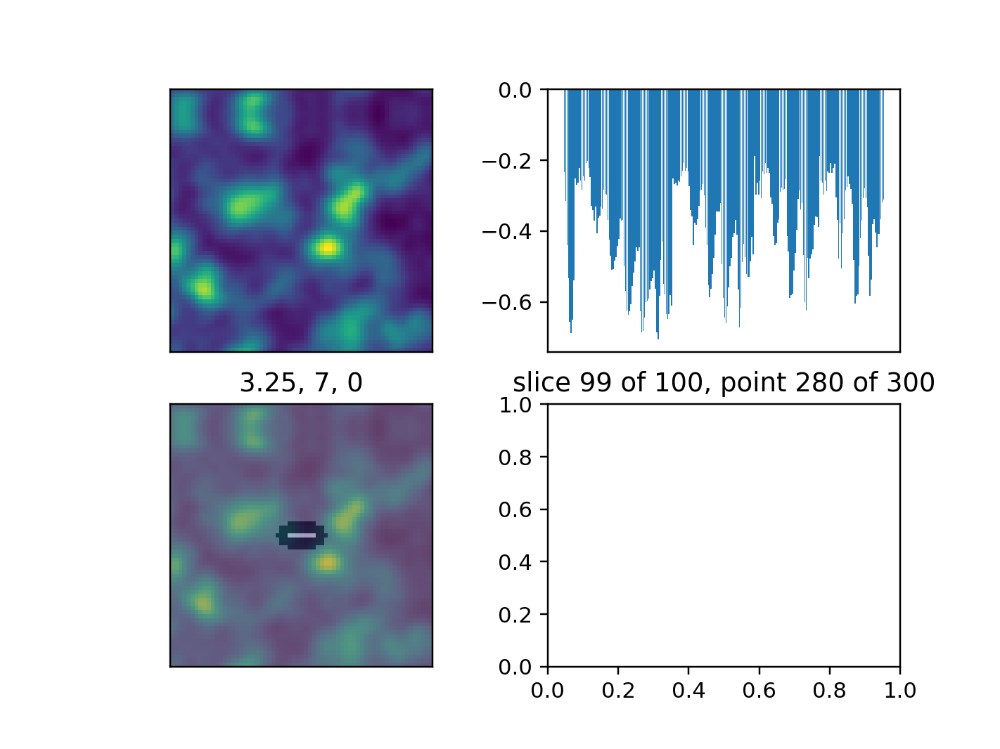

In [32]:
# find distribution on each slice
# pad by the radius of the template
Ibxyp = np.pad(Ibxy,r,'symmetric')
Ibxyz1p = np.pad(Ibxyz1,r,'symmetric')
Ibxyz2p = np.pad(Ibxyz2,r,'symmetric')

Ip = np.pad(I,r,'symmetric')


distribution = np.zeros((I.shape[0],n_location_samples))
f,ax = plt.subplots(2,2)
for i in range(I.shape[0]):
    # find a random row and column
    for it in range(n_location_samples):
        row = np.random.randint(I.shape[1])
        col = np.random.randint(I.shape[2])
        roi = np.copy(Ibxyp[i+r, row-r+r:row+r+1+r, col-r+r:col+r+1+r])
        
        fgm = np.sum(roi*(templates==1),axis=(1,2)) / np.sum((templates==1),axis=(1,2))
        bgm = np.sum(roi*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
        bg2m = np.sum(roi**2*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
        signal = fgm - bgm
        noise = np.sqrt(bg2m - bgm**2)
        noise = np.std(roi) # use the whole roi, not the background.  This means you can't "sneakily" position the background
        snr = np.squeeze(signal/noise)
        

        ind = np.argmax(snr)
        Tind = templates[ind]
        nind = names[ind]
        
        distribution[i,it] = np.max(snr)
        
        # a picture
        if not it%20:
            ax[0,0].cla()
            ax[0,0].imshow(roi)
            ax[0,0].set_xticks([])
            ax[0,0].set_yticks([])
            ax[0,1].cla()
            ax[0,1].bar(range(len(snr)),snr)
            ax[0,1].set_xticks([])


            # draw them together
            ax[1,0].cla()
            ax[1,0].imshow(roi)
            ax[1,0].imshow(Tind,alpha=0.5,cmap='gray')
            ax[1,0].set_title(f'{nind[0]}, {nind[1]}, {int(nind[2]*180/np.pi)}')
            ax[1,0].set_xticks([])
            ax[1,0].set_yticks([])

            ax[1,1].cla()
            #ax[1,1].text(0,0.5,reason)
            ax[1,1].set_title(f'slice {i} of {I.shape[0]}, point {it} of {n_location_samples}')


            f.canvas.draw()
    
    
    


<IPython.core.display.Javascript object>


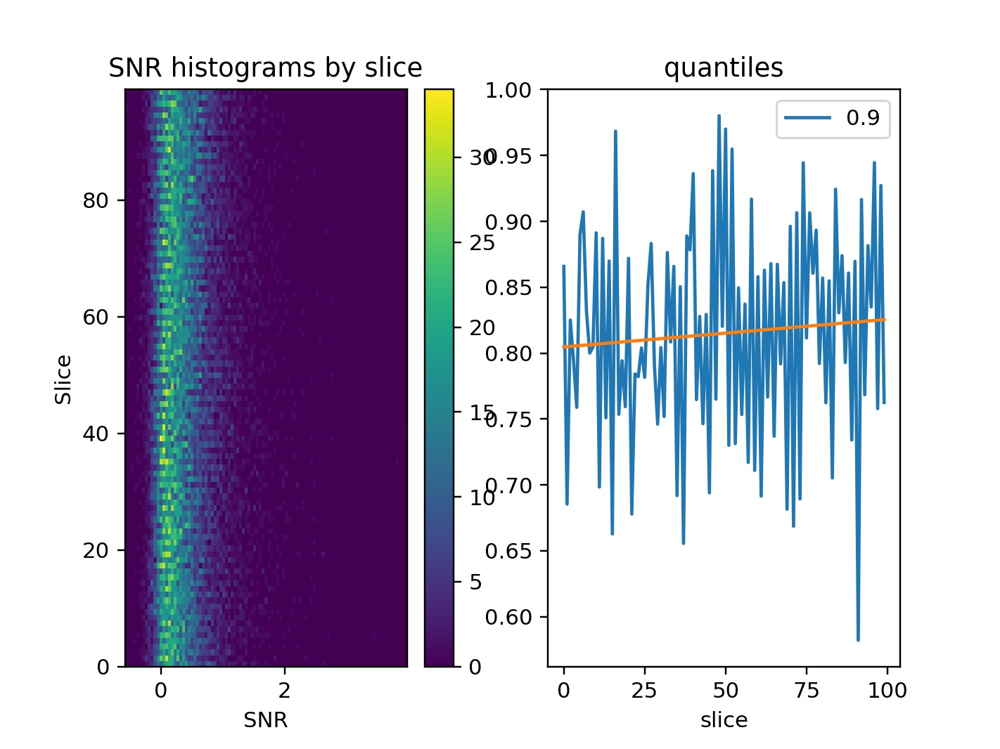

In [33]:
if n_location_samples:
    nbins = 100
    bins = np.linspace(np.min(distribution),np.max(distribution),nbins)
    histogram = np.stack([np.histogram(d,bins)[0] for d in distribution])
    f,ax = plt.subplots(1,2)
    h = ax[0].imshow(histogram,origin='lower',extent=(bins[0],bins[-1],0,I.shape[0]-1),aspect='auto') # left right bottom top
    
    ax[0].set_xlabel('SNR')
    ax[0].set_ylabel('Slice')
    plt.colorbar(h,ax=ax[0])
    
    ax[0].set_title('SNR histograms by slice')

    
    qs = [snr_percentile_cutoff]
    qvals = np.quantile(distribution,qs,axis=1)
    # we see that the threshold is pretty much linear with depth
    B = np.stack([np.ones(I.shape[0]),np.arange(I.shape[0])])
    BB = B@B.transpose()
    qvals = np.quantile(distribution,qs,axis=1)
    By = qvals@B.transpose()
    coeffs = np.linalg.solve(BB,By.transpose())
    
    ax[1].plot(qvals.transpose())
    ax[1].legend(qs)
    ax[1].set_title('quantiles')
    ax[1].set_xlabel('slice')
    ax[1].plot(np.arange(I.shape[0]),coeffs[0] + coeffs[1]*np.arange(I.shape[0]))
    f.savefig(prefix + 'snr_histogram.png')
    
    f.canvas.draw()


<IPython.core.display.Javascript object>


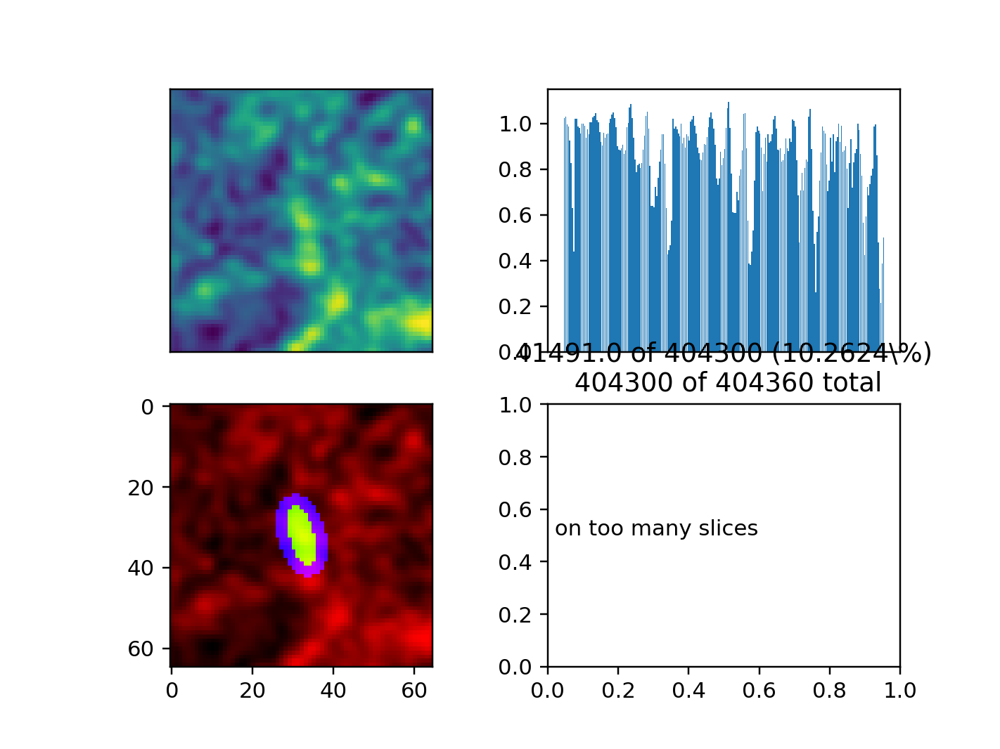

In [34]:
# loop through regions and through templates
# pad by the radius of the templates
Ibxyp = np.pad(Ibxy,r,'symmetric')
Ibxyz1p = np.pad(Ibxyz1,r,'symmetric')
Ibxyz2p = np.pad(Ibxyz2,r,'symmetric')
Ip = np.pad(I,r,'symmetric')


f,ax = plt.subplots(2,2)

goodinds = np.ones(len(locs[0]))
reasons = np.zeros( (len(locs[0]),7) )

# we also need an id image
Ipid = np.zeros_like(Ip,dtype=int)
Ipidgood = np.zeros_like(Ip,dtype=int)


for i,l in enumerate(zip(*locs)):
    # let's draw them    
    roi = np.copy(Ibxyp[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r])
    roiz1 = np.copy(Ibxyz1p[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r])
    roiz2 = np.copy(Ibxyz2p[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r])
   
    
    
    
    # now loop thorugh the templates
    fgm = np.sum(roi*(templates==1),axis=(1,2)) / np.sum((templates==1),axis=(1,2))
    bgm = np.sum(roi*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))    
    signal = fgm - bgm    
    noise = np.std(roi)
    snr = np.squeeze(signal/noise)
    
    ind = np.argmax(snr)
    Tind = templates[ind]
    nind = names[ind]    
    
    
    # do it again for blur in z
    fgm = np.sum(roiz1*(templates[ind]==1)) / np.sum((templates[ind]==1))
    bgm = np.sum(roiz1*(templates[ind]==-1)) / np.sum((templates[ind]==-1))    
    signal = fgm - bgm
    noise = np.std(roiz1)
    snrZ1 = np.squeeze(signal/noise)
    
    fgm = np.sum(roiz2*(templates[ind]==1)) / np.sum((templates[ind]==1))
    bgm = np.sum(roiz2*(templates[ind]==-1)) / np.sum((templates[ind]==-1))    
    signal = fgm - bgm    
    noise = np.std(roiz2)
    snrZ2 = np.squeeze(signal/noise)
    
    
    # treshold for this slice    
    snrthresh = coeffs[0] + coeffs[1]*l[0]    
    
    
    # let's filter them out        
    reason = ''
    if nind[0] > ovalmax: # ovacity
        goodinds[i] = 0
        reasons[i,0] = 1
        reason += ' too oval '
    if nind[1] < sizemin: # size
        goodinds[i] = 0
        reasons[i,1] = 1
        reason += ' too small '
    if nind[1] > sizemax: # size
        goodinds[i] = 0
        reasons[i,2] = 1
        reason += ' too big '
    if snr[ind] < snrthresh: 
        reasons[i,3] = 1
        goodinds[i] = 0
        reason += ' low contrast '
    if snr[ind] > snrZ1*snrZ1_factor: 
        reasons[i,5] = 1
        goodinds[i] = 0
        reason += ' not on adjacent slices '
    if snr[ind] < snrZ2:
        reasons[i,6] = 1
        goodinds[i] = 0
        reason += ' on too many slices '
    if not reason:
        reason = 'good'
    
    
    # add to integer images
    Ipid[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r][Tind==1] = i
    if reason == 'good':
        Ipidgood[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r][Tind==1] = i
    
    
    if not i%100:
        
        ax[0,0].cla()
        ax[0,0].imshow(roi)
        ax[0,0].set_xticks([])
        ax[0,0].set_yticks([])
        ax[0,1].cla()
        ax[0,1].bar(range(len(snr)),snr)
        ax[0,1].set_xticks([])
        

        # draw them together
        ax[1,0].cla()
        ax[1,0].imshow(roi)
        ax[1,0].imshow(Tind,alpha=0.5)
        ax[1,0].set_title(f'{nind[0]}, {nind[1]}, {int(nind[2]*180/np.pi)}')
        ax[1,0].set_xticks([])
        ax[1,0].set_yticks([])

        ax[1,0].cla()
        ax[1,0].imshow(np.stack([(roi-np.min(roi))/(np.max(roi)-np.min(roi)),Tind==1,Tind==-1],-1))
        
        
        ax[1,1].cla()
        ax[1,1].text(0,0.5,reason)
        ax[1,1].set_title(f'{np.sum(goodinds[:i+1])} of {i} ({100*np.mean(goodinds[:i+1]):3g}\%)\n {i} of {len(locs[0])} total')

        
        f.canvas.draw()
    

In [35]:
reasons

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 1., 0.]])

<IPython.core.display.Javascript object>


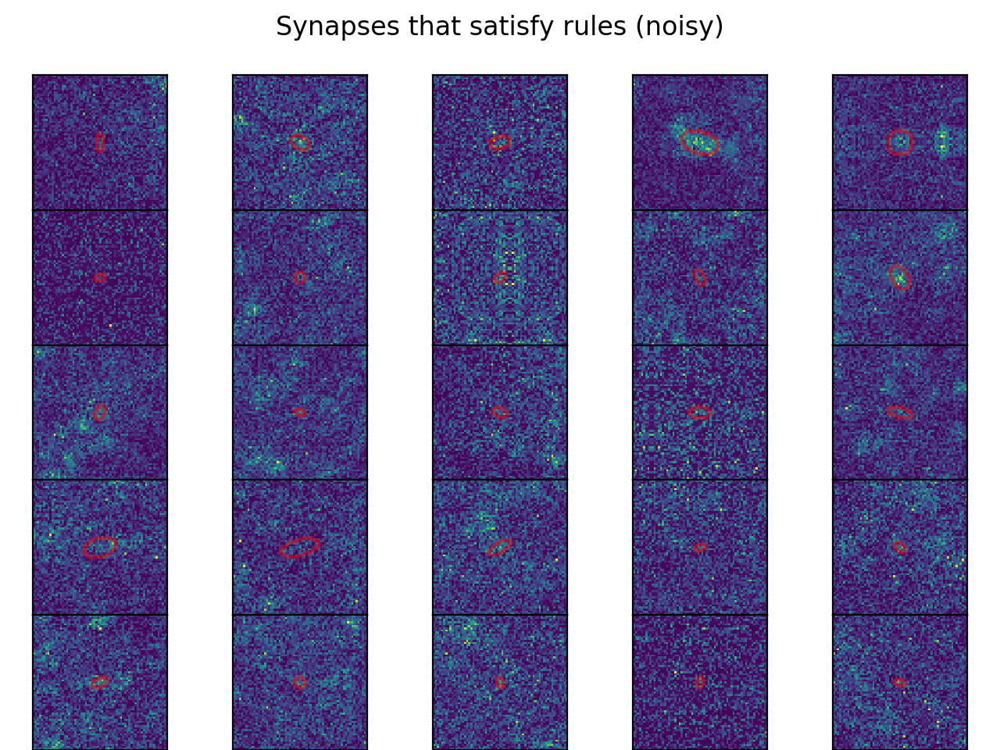

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


<IPython.core.display.Javascript object>


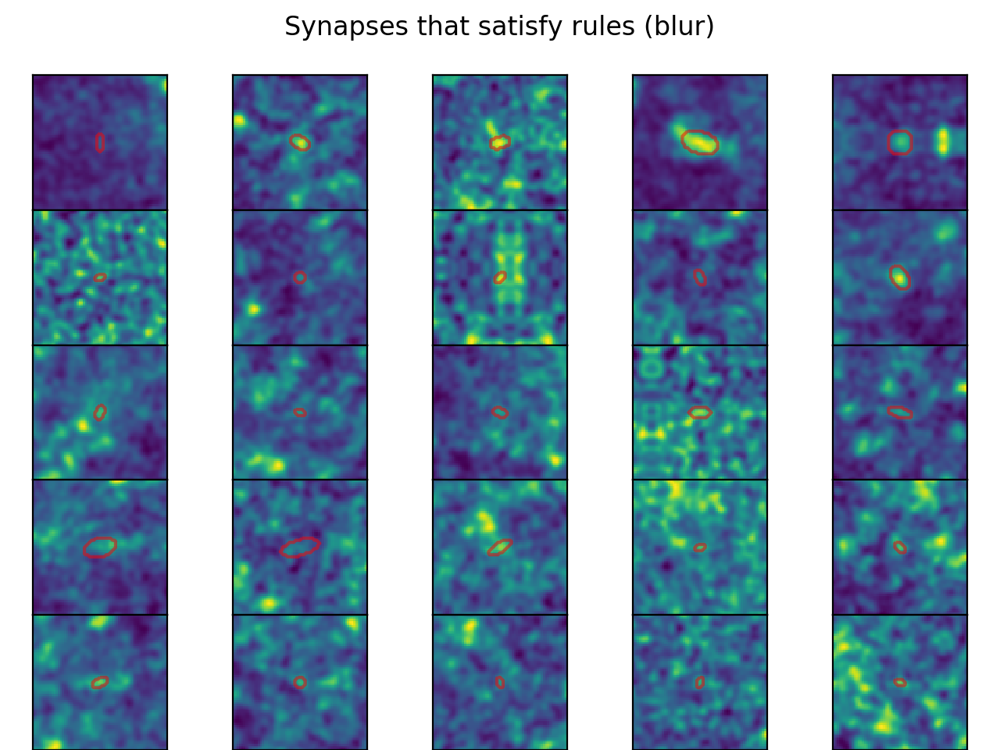

(36, 170, 156)
(18, 755, 363)
(70, 530, 287)
(66, 644, 555)
(2, 0, 374)
(2, 410, 46)
(0, 276, 280)
(88, 4, 1019)
(20, 60, 747)
(92, 99, 833)
(50, 507, 844)
(14, 69, 608)
(16, 976, 725)
(72, 196, 23)
(28, 705, 690)
(4, 562, 297)
(24, 821, 692)
(54, 942, 835)
(78, 464, 495)
(68, 811, 399)
(14, 910, 552)
(46, 596, 608)
(88, 587, 742)
(2, 847, 199)
(16, 757, 896)


In [36]:
# find 5 good examples
Ibxyp = np.pad(Ibxy,r,'symmetric')
Ip = np.pad(I,r,'symmetric')
all_inds = np.arange(reasons.shape[0])
theseinds = np.all(reasons==0,axis=1)
nshow = 25
nrow = int(np.ceil(np.sqrt(float(nshow))))

myinds = np.random.choice(all_inds[theseinds],nshow)
lall = np.stack(locs)
myls = lall[:,myinds]

f0,ax0 = plt.subplots(nrow,nrow)
ax0 = ax0.ravel()
f1,ax1 = plt.subplots(nrow,nrow)
ax1 = ax1.ravel()
for i,l in enumerate(zip(*myls)):
    print(l)
    # extracct the roi
    roi = Ibxyp[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r]    


    ax1[i].imshow(roi)
    ax1[i].set_xticks([])
    ax1[i].set_yticks([])
    
    
    # find the template
    fgm = np.sum(roi*(templates==1),axis=(1,2)) / np.sum((templates==1),axis=(1,2))
    bgm = np.sum(roi*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    bg2m = np.sum(roi**2*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    signal = fgm - bgm
    noise = np.sqrt(bg2m - bgm**2)    
    noise = np.std(roi)
    snr = np.squeeze(signal/noise)
    
    ind = np.argmax(snr)
    Tind = templates[ind]
    nind = names[ind]
    
    ax1[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
    
    
    # extracct the roi
    roi = Ip[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r] 
    # rank standardize it
    #roi = rankdata(roi).reshape(roi.shape)
    #roi -= np.mean(roi)
    #roi /= np.std(roi)
    ax0[i].imshow(roi)
    ax0[i].set_xticks([])
    ax0[i].set_yticks([])
    ax0[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
    
f0.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f1.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f0.suptitle('Synapses that satisfy rules (noisy)')
f0.savefig(prefix + 'good_noisy.png')
f1.suptitle('Synapses that satisfy rules (blur)')
f1.savefig(prefix + 'good_blur.png')

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


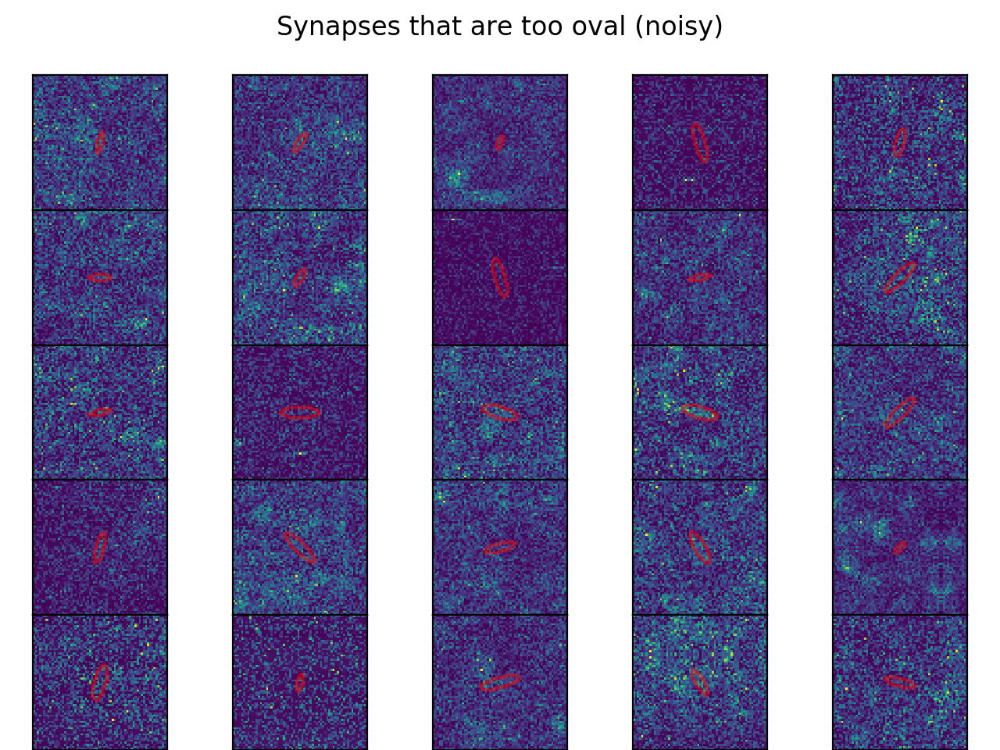

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


<IPython.core.display.Javascript object>


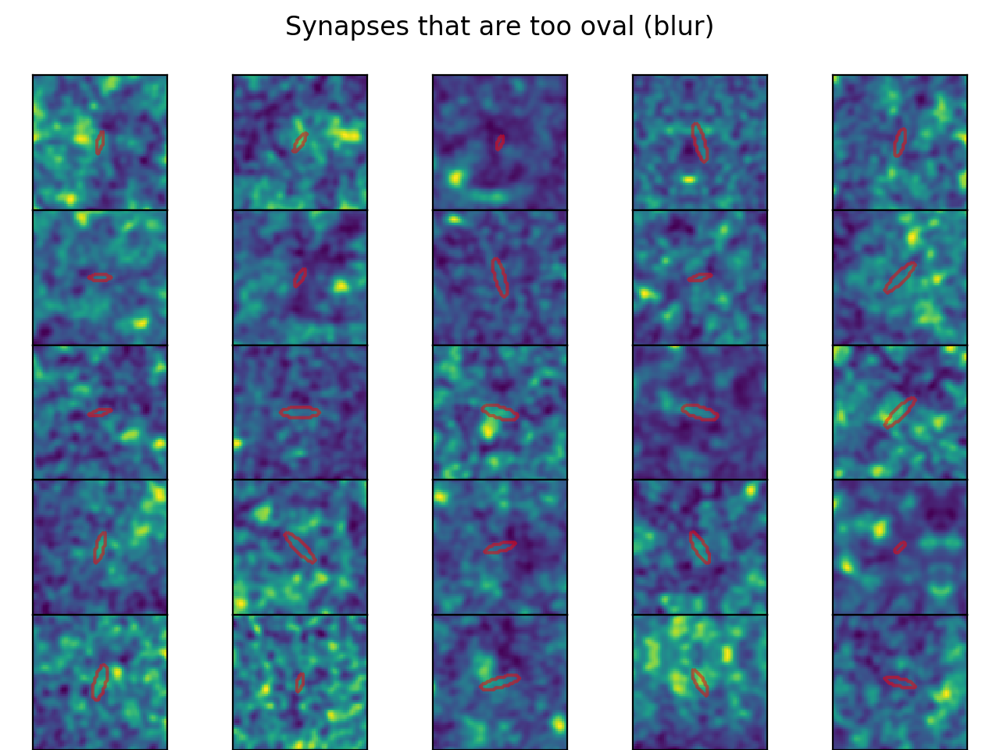

(50, 145, 260)
(34, 657, 698)
(34, 600, 960)
(0, 490, 5)
(48, 474, 524)
(70, 63, 290)
(56, 607, 881)
(0, 430, 51)
(54, 521, 941)
(14, 977, 736)
(88, 375, 568)
(0, 892, 61)
(46, 581, 535)
(0, 935, 851)
(84, 322, 889)
(74, 159, 116)
(44, 138, 789)
(0, 153, 233)
(26, 483, 685)
(22, 960, 1004)
(6, 176, 85)
(2, 578, 133)
(38, 478, 670)
(82, 13, 372)
(68, 723, 392)


In [37]:
# find 5 examples that are too oval
Ibxyp = np.pad(Ibxy,r,'symmetric')
Ip = np.pad(I,r,'symmetric')
all_inds = np.arange(reasons.shape[0])
theseinds = reasons[:,0]==1

myinds = np.random.choice(all_inds[theseinds],nshow)
lall = np.stack(locs)
myls = lall[:,myinds]

f0,ax0 = plt.subplots(nrow,nrow)
ax0 = ax0.ravel()
f1,ax1 = plt.subplots(nrow,nrow)
ax1 = ax1.ravel()
for i,l in enumerate(zip(*myls)):
    print(l)
    # extracct the roi
    roi = Ibxyp[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r]    

    ax1[i].imshow(roi)
    ax1[i].set_xticks([])
    ax1[i].set_yticks([])
    
    
    
    # find the template
    fgm = np.sum(roi*(templates==1),axis=(1,2)) / np.sum((templates==1),axis=(1,2))
    bgm = np.sum(roi*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    bg2m = np.sum(roi**2*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    signal = fgm - bgm
    noise = np.sqrt(bg2m - bgm**2)    
    noise = np.std(roi)
    snr = np.squeeze(signal/noise)
    
    ind = np.argmax(snr)
    Tind = templates[ind]
    nind = names[ind]
    
    ax1[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
    
    
    # extracct the roi
    roi = Ip[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r] 


    
    ax0[i].imshow(roi)
    ax0[i].set_xticks([])
    ax0[i].set_yticks([])
    ax0[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
f0.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f0.suptitle('Synapses that are too oval (noisy)')
f0.savefig(prefix + 'too_oval_noisy.png')

    
f1.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f1.suptitle('Synapses that are too oval (blur)')
f1.savefig(prefix + 'too_oval_blur.png')




/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


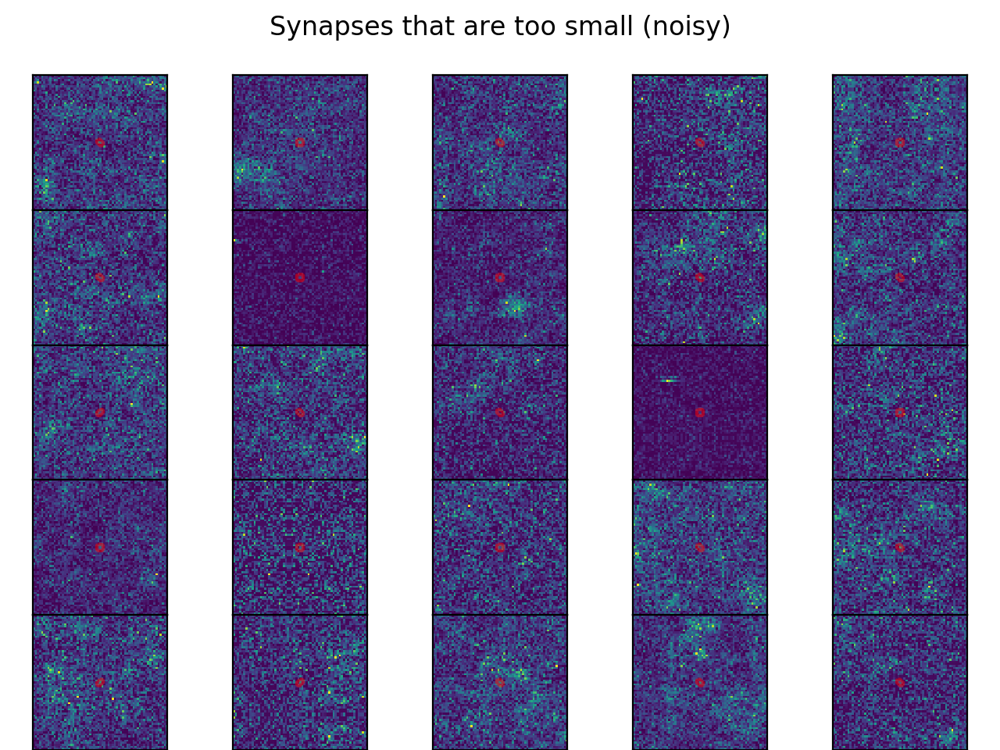

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


<IPython.core.display.Javascript object>


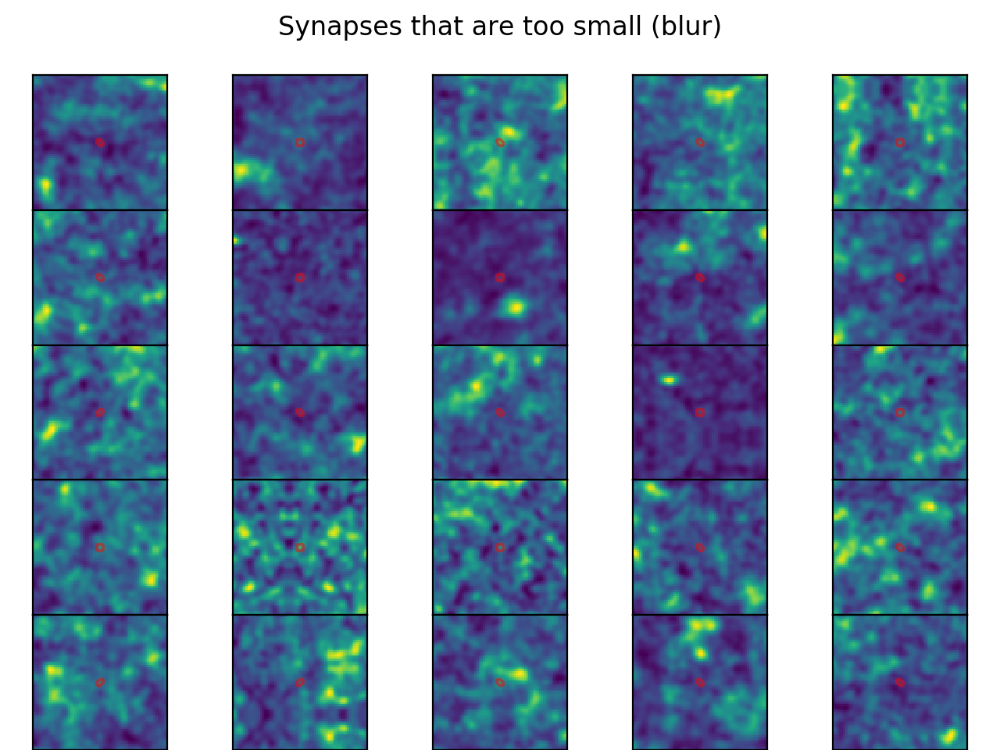

(12, 588, 330)
(68, 629, 588)
(74, 113, 427)
(60, 164, 133)
(14, 25, 308)
(24, 752, 640)
(0, 848, 89)
(8, 505, 815)
(88, 959, 701)
(24, 496, 863)
(60, 152, 361)
(14, 821, 770)
(80, 78, 278)
(0, 1011, 653)
(54, 757, 571)
(90, 792, 839)
(36, 123, 5)
(70, 390, 782)
(14, 350, 323)
(36, 364, 717)
(6, 244, 886)
(74, 1008, 587)
(18, 108, 823)
(24, 230, 456)
(84, 81, 301)


In [38]:
# find 5 examples that are too small
Ibxyp = np.pad(Ibxy,r,'symmetric')
Ip = np.pad(I,r,'symmetric')
all_inds = np.arange(reasons.shape[0])
theseinds = reasons[:,1]==1

myinds = np.random.choice(all_inds[theseinds],nshow)
lall = np.stack(locs)
myls = lall[:,myinds]

f0,ax0 = plt.subplots(nrow,nrow)
ax0 = ax0.ravel()
f1,ax1 = plt.subplots(nrow,nrow)
ax1 = ax1.ravel()
for i,l in enumerate(zip(*myls)):
    print(l)
    # extracct the roi
    roi = Ibxyp[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r]    
    

    ax1[i].imshow(roi)
    ax1[i].set_xticks([])
    ax1[i].set_yticks([])

    
    # find the template
    fgm = np.sum(roi*(templates==1),axis=(1,2)) / np.sum((templates==1),axis=(1,2))
    bgm = np.sum(roi*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    bg2m = np.sum(roi**2*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    signal = fgm - bgm
    noise = np.sqrt(bg2m - bgm**2)    
    noise = np.std(roi)
    snr = np.squeeze(signal/noise)
    
    ind = np.argmax(snr)
    Tind = templates[ind]
    nind = names[ind]
    
    ax1[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
    
    
    # extracct the roi
    roi = Ip[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r] 
    
    ax0[i].imshow(roi)
    ax0[i].set_xticks([])
    ax0[i].set_yticks([])
    ax0[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
f0.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f0.suptitle('Synapses that are too small (noisy)')
f0.savefig(prefix + 'too_small_noisy.png')


f1.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f1.suptitle('Synapses that are too small (blur)')
f1.savefig(prefix + 'too_small_blur.png')


/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


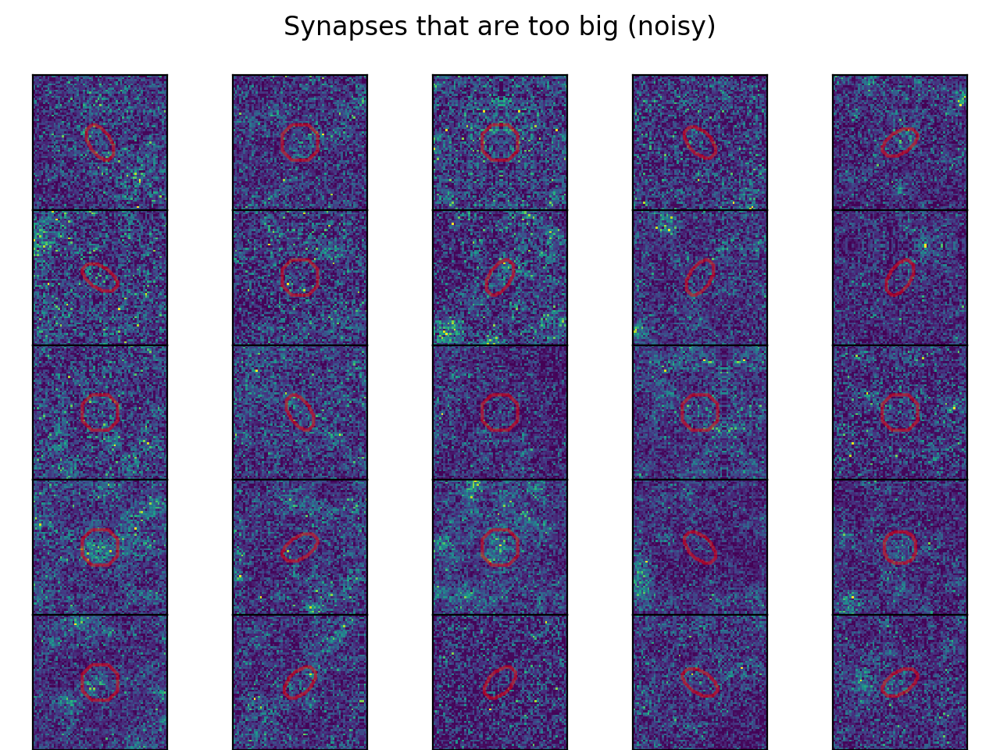

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


<IPython.core.display.Javascript object>


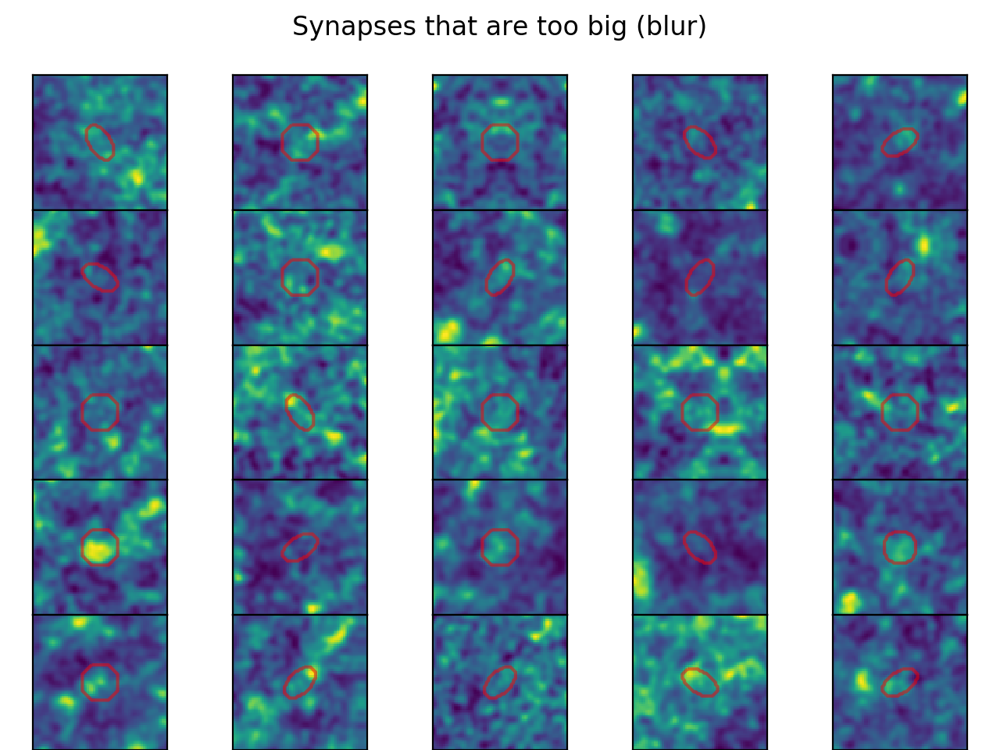

(22, 474, 299)
(62, 585, 872)
(32, 490, 1023)
(92, 424, 546)
(50, 267, 251)
(28, 698, 787)
(84, 377, 818)
(8, 973, 427)
(62, 326, 950)
(94, 15, 285)
(22, 446, 731)
(30, 447, 419)
(78, 723, 611)
(20, 101, 1012)
(64, 840, 689)
(4, 118, 319)
(56, 332, 636)
(18, 35, 501)
(50, 992, 973)
(40, 806, 945)
(32, 313, 492)
(24, 455, 994)
(44, 328, 180)
(84, 838, 845)
(60, 480, 934)


In [39]:
# find 5 examples that are too big
Ibxyp = np.pad(Ibxy,r,'symmetric')
Ip = np.pad(I,r,'symmetric')
all_inds = np.arange(reasons.shape[0])
theseinds = reasons[:,2]==1

myinds = np.random.choice(all_inds[theseinds],nshow)
lall = np.stack(locs)
myls = lall[:,myinds]

f0,ax0 = plt.subplots(nrow,nrow)
ax0 = ax0.ravel()
f1,ax1 = plt.subplots(nrow,nrow)
ax1 = ax1.ravel()
for i,l in enumerate(zip(*myls)):
    print(l)
    # extracct the roi
    roi = Ibxyp[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r]    
    
    ax1[i].imshow(roi)
    ax1[i].set_xticks([])
    ax1[i].set_yticks([])
    
    
    
    
    
    # find the template
    fgm = np.sum(roi*(templates==1),axis=(1,2)) / np.sum((templates==1),axis=(1,2))
    bgm = np.sum(roi*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    bg2m = np.sum(roi**2*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    signal = fgm - bgm
    noise = np.sqrt(bg2m - bgm**2)    
    noise = np.std(roi)
    snr = np.squeeze(signal/noise)
    
    ind = np.argmax(snr)
    Tind = templates[ind]
    nind = names[ind]
    
    ax1[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
    
    
    # extracct the roi
    roi = Ip[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r] 
    
    ax0[i].imshow(roi)
    ax0[i].set_xticks([])
    ax0[i].set_yticks([])
    ax0[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
f0.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f0.suptitle('Synapses that are too big (noisy)')
f0.savefig(prefix + 'too_big_noisy.png')
f1.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f1.suptitle('Synapses that are too big (blur)')
f1.savefig(prefix + 'too_big_blur.png')

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


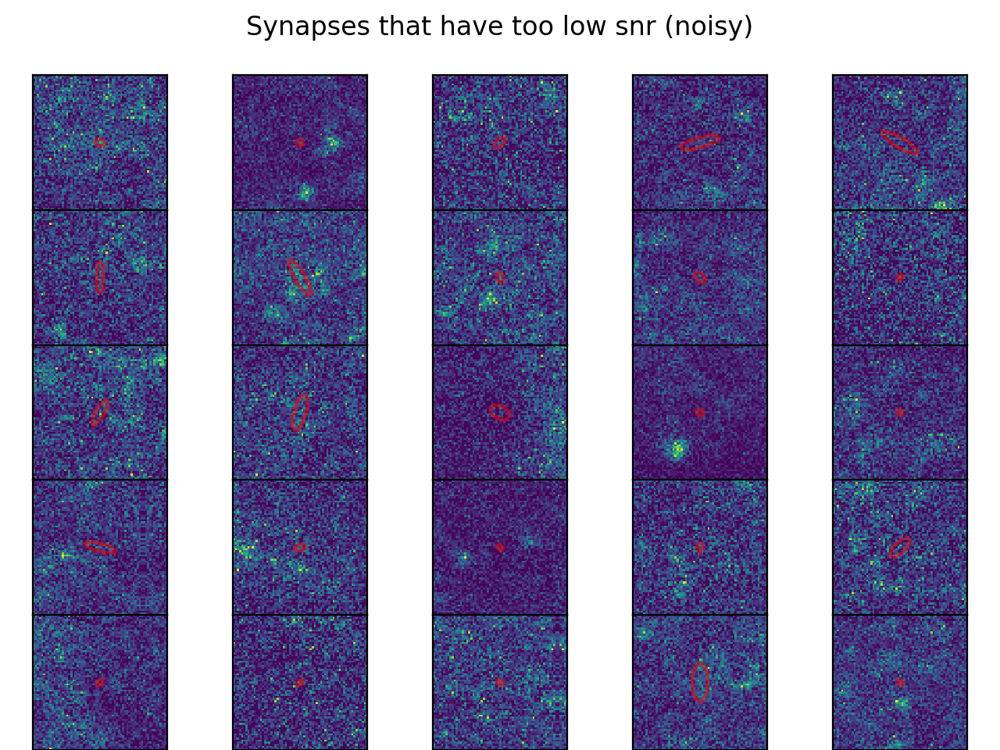

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


<IPython.core.display.Javascript object>


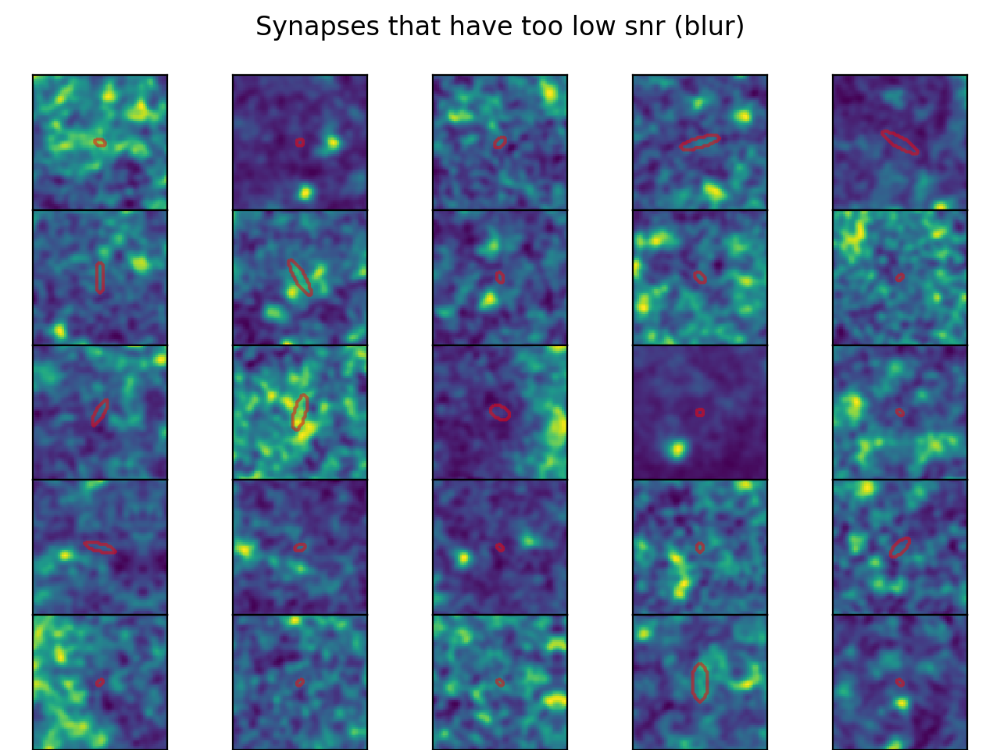

(14, 139, 863)
(0, 489, 788)
(46, 911, 674)
(10, 764, 480)
(10, 835, 823)
(48, 523, 898)
(26, 244, 478)
(22, 662, 566)
(58, 169, 583)
(82, 479, 469)
(18, 342, 640)
(50, 527, 552)
(4, 584, 481)
(46, 388, 972)
(48, 660, 712)
(74, 250, 1003)
(70, 484, 952)
(20, 782, 916)
(56, 763, 755)
(60, 670, 952)
(94, 96, 618)
(78, 854, 612)
(76, 295, 996)
(90, 70, 465)
(68, 79, 531)


In [40]:
# find 5 examples that are too low snr
Ibxyp = np.pad(Ibxy,r,'symmetric')
Ip = np.pad(I,r,'symmetric')
all_inds = np.arange(reasons.shape[0])
theseinds = reasons[:,3]==1

myinds = np.random.choice(all_inds[theseinds],nshow)
lall = np.stack(locs)
myls = lall[:,myinds]

f0,ax0 = plt.subplots(nrow,nrow)
ax0 = ax0.ravel()
f1,ax1 = plt.subplots(nrow,nrow)
ax1 = ax1.ravel()
for i,l in enumerate(zip(*myls)):
    print(l)
    # extracct the roi
    roi = Ibxyp[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r]    
    
    ax1[i].imshow(roi)
    ax1[i].set_xticks([])
    ax1[i].set_yticks([])        
    
    # find the template
    fgm = np.sum(roi*(templates==1),axis=(1,2)) / np.sum((templates==1),axis=(1,2))
    bgm = np.sum(roi*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    bg2m = np.sum(roi**2*(templates==-1),axis=(1,2)) / np.sum((templates==-1),axis=(1,2))
    signal = fgm - bgm
    noise = np.sqrt(bg2m - bgm**2)   
    noise = np.std(roi)
    snr = np.squeeze(signal/noise)
    
    ind = np.argmax(snr)
    Tind = templates[ind]
    nind = names[ind]
    
    ax1[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
    
    
    # extracct the roi
    roi = Ip[l[0]+r, l[1]-r+r:l[1]+r+1+r, l[2]-r+r:l[2]+r+1+r] 
    
    ax0[i].imshow(roi)
    ax0[i].set_xticks([])
    ax0[i].set_yticks([])
    ax0[i].contour(Tind==1,levels=[0.5],colors='r',alpha=0.5)
f0.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f0.suptitle('Synapses that have too low snr (noisy)')
f0.savefig(prefix + 'too_low_snr_noisy.png')
f1.subplots_adjust(left=0,right=1,bottom=0,top=0.9,hspace=0,wspace=0)
f1.suptitle('Synapses that have too low snr (blur)')
f1.savefig(prefix + 'too_low_snr_blur.png')

In [41]:
# print out info
# for each type of failure, how many (and what fraction) failed for that reason
reason_strings = ['too oval', 'too small', 'too big', 'low snr','too square', 'not on adjacent slices', 'on too many slices']
total = reasons.shape[0]
print(f'total {total}')

# good ones
nGood = np.sum(np.all(reasons==0,1))
print(f'good {nGood} ({nGood/total*100:04.2f}%)')

for i,re in enumerate(reason_strings):
    nR = np.sum(reasons[:,i])
    print(f'{re} {nR} ({nR/total*100:04.2f}%)')
    



total 404360
good 41497 (10.26%)
too oval 54320.0 (13.43%)
too small 170194.0 (42.09%)
too big 10437.0 (2.58%)
low snr 278357.0 (68.84%)
too square 0.0 (0.00%)
not on adjacent slices 218639.0 (54.07%)
on too many slices 29122.0 (7.20%)


/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


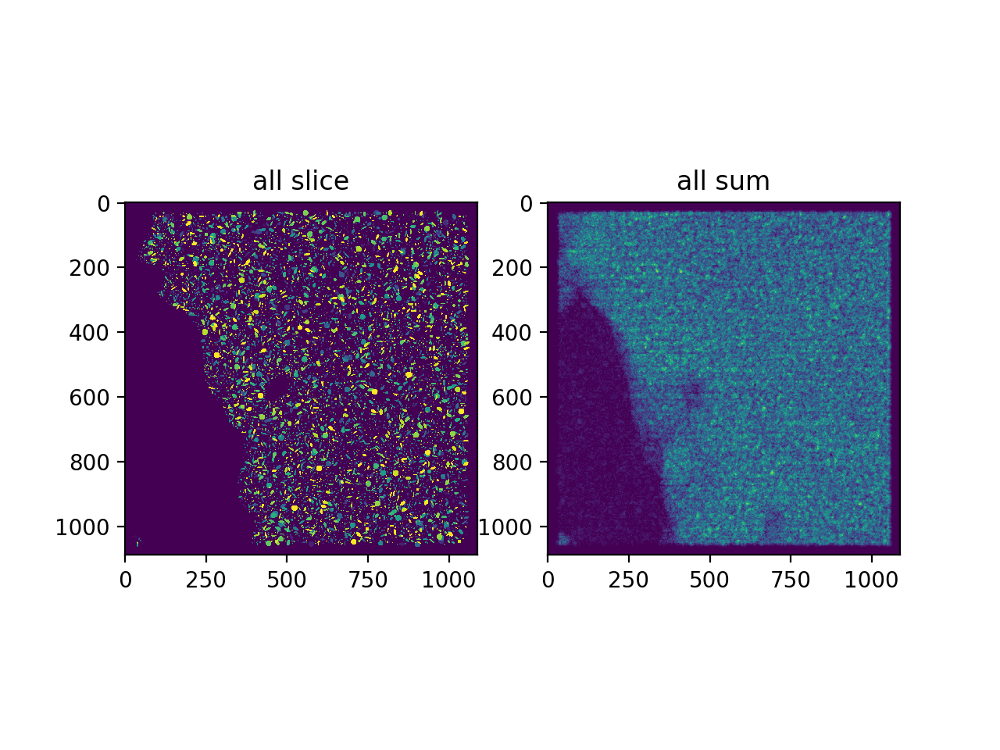

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


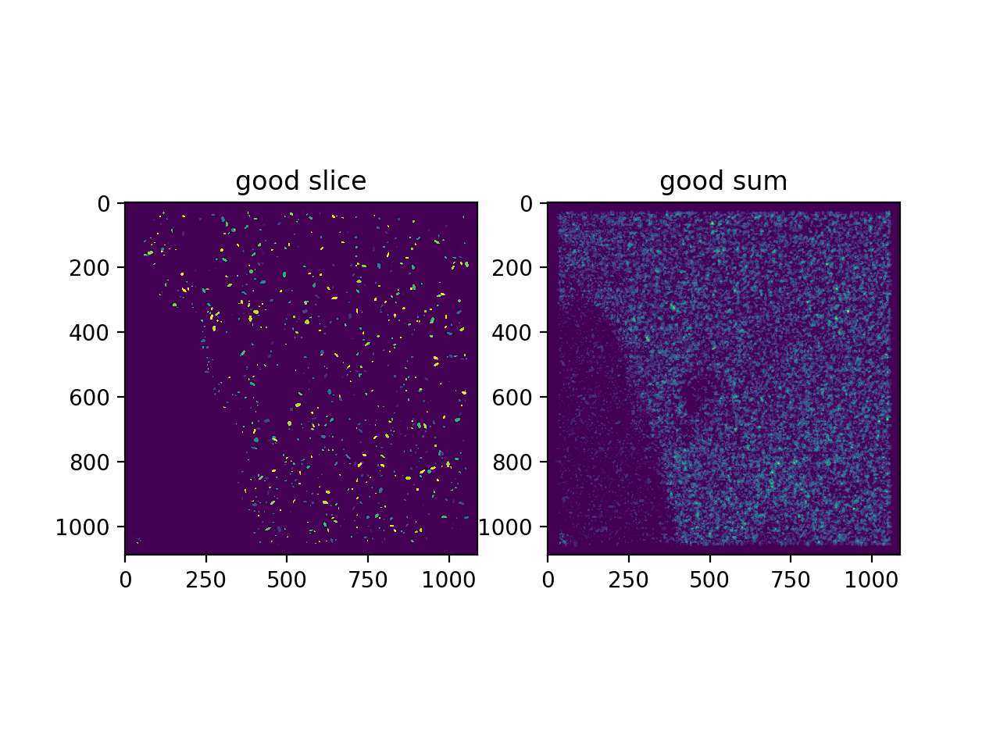

Text(0.5, 1.0, 'good sum')

In [42]:

f,ax = plt.subplots(1,2)
ax[0].imshow(Ipid[Ipid.shape[0]//2])
ax[0].set_title('all slice')
ax[1].imshow(np.sum(Ipid,0))
ax[1].set_title('all sum')

f,ax = plt.subplots(1,2)
ax[0].imshow(Ipidgood[Ipidgood.shape[0]//2])
ax[0].set_title('good slice')
ax[1].imshow(np.sum(Ipidgood,0))
ax[1].set_title('good sum')

In [43]:
end = time.time()
print('hours')
print((end - start)/60.0/60.0)
print('or minutes')
print((end - start)/60.0)

hours
3.502891040974193
or minutes
210.17346245845158


In [ ]:
# write out my integer tifs for looking at accuracy using previous matlab scripts
# note that this is BIGGER than 16 bits
# we'll need 32 bits

In [44]:


io.imsave(prefix + 'detection_ids.tif',Ipidgood[r:-r,r:-r,r:-r].astype(np.uint32))

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: test_detection_ids.tif is a low contrast image
  """Entry point for launching an IPython kernel.


In [45]:
If = np.copy(I).astype(float)
If = If - np.min(If)
If = If / np.max(If)
If *= 65535
If = If.astype(np.uint16)
io.imsave(prefix + 'image.tif',If)


S = (np.copy(Ipidgood[r:-
                      r,r:-r,r:-r])>0.0).astype(float) * 65535
S = S.astype(np.uint16)
io.imsave(prefix + 'labels.tif',S)


io.imsave(prefix + 'mask.tif',mask.astype(np.uint16))

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: test_mask.tif is a low contrast image
  from ipykernel import kernelapp as app
